# Packages

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

In [2]:
import networkx as nx
import matplotlib.pyplot as plt

In [3]:
from sklearn.cluster import KMeans

In [4]:
import math

In [5]:
absolute_path = 'Data/data2/'

In [6]:
# Read facebook dataset
plt.figure(figsize=(30,20))
G=nx.read_edgelist('Data/fbData.txt',create_using=nx.Graph(),nodetype=int)

<Figure size 3000x2000 with 0 Axes>

In [7]:
row = G.number_of_nodes()

In [8]:
row

4039

In [9]:
edge_mat= nx.to_numpy_array(G, nodelist=[i for i in range(row)])

In [10]:
print (edge_mat)

[[0. 1. 1. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


In [11]:
#Read our decision Matrix
data = pd.read_csv("Data/Matrix.csv")
data

,Node,w_Node,DC,BC,CC,EC
0,0,0,0.085934,1.463059e-01,0.353343,3.391796e-05
1,1,1,0.004210,2.783274e-06,0.261376,6.045346e-07
2,2,2,0.002476,7.595021e-08,0.261258,2.233461e-07
3,3,3,0.004210,1.685066e-06,0.261376,6.635648e-07
4,4,4,0.002476,1.840332e-07,0.261258,2.236416e-07
...,...,...,...,...,...,...
4034,4034,4034,0.000495,0.000000e+00,0.183989,2.951270e-10
4035,4035,4035,0.000248,0.000000e+00,0.183980,2.912901e-10
4036,4036,4036,0.000495,0.000000e+00,0.183989,2.931223e-10
4037,4037,4037,0.000991,7.156847e-08,0.184005,2.989233e-10


In [12]:
k=data.sort_values(by = ['w_Node'])
#data.to_csv("data.csv",index=False)

In [13]:
k

,Node,w_Node,DC,BC,CC,EC
0,0,0,0.085934,1.463059e-01,0.353343,3.391796e-05
1,1,1,0.004210,2.783274e-06,0.261376,6.045346e-07
2,2,2,0.002476,7.595021e-08,0.261258,2.233461e-07
3,3,3,0.004210,1.685066e-06,0.261376,6.635648e-07
4,4,4,0.002476,1.840332e-07,0.261258,2.236416e-07
...,...,...,...,...,...,...
4034,4034,4034,0.000495,0.000000e+00,0.183989,2.951270e-10
4035,4035,4035,0.000248,0.000000e+00,0.183980,2.912901e-10
4036,4036,4036,0.000495,0.000000e+00,0.183989,2.931223e-10
4037,4037,4037,0.000991,7.156847e-08,0.184005,2.989233e-10


In [14]:
k.to_csv("data.csv",index=False)

In [15]:
X = data[["DC","BC","CC","EC"]]


In [16]:
X

,DC,BC,CC,EC
0,0.085934,1.463059e-01,0.353343,3.391796e-05
1,0.004210,2.783274e-06,0.261376,6.045346e-07
2,0.002476,7.595021e-08,0.261258,2.233461e-07
3,0.004210,1.685066e-06,0.261376,6.635648e-07
4,0.002476,1.840332e-07,0.261258,2.236416e-07
...,...,...,...,...
4034,0.000495,0.000000e+00,0.183989,2.951270e-10
4035,0.000248,0.000000e+00,0.183980,2.912901e-10
4036,0.000495,0.000000e+00,0.183989,2.931223e-10
4037,0.000991,7.156847e-08,0.184005,2.989233e-10


In [17]:
influential = pd.read_csv("Data/w_Out1.csv")
inf10 = influential.head(7)
inf10

,Node,w_Node,DC,BC,CC,EC,C
0,107,107,0.258791,0.480518,0.459699,2.606940e-04,0.927913
1,1684,1684,0.196137,0.337797,0.393606,7.164260e-06,0.696069
2,3437,3437,0.135463,0.236115,0.314413,9.531613e-08,0.488526
3,1912,1912,0.186974,0.229295,0.350947,9.540696e-02,0.480827
4,1085,1085,0.016345,0.149015,0.357852,3.164082e-06,0.308478
5,0,0,0.085934,0.146306,0.353343,3.391796e-05,0.303198
6,698,698,0.016840,0.115330,0.271189,1.116876e-09,0.238868


# Top 10 influent (w_topsis)

In [18]:
Y = inf10[["DC","BC","CC","EC"]]
Yrr = Y.to_numpy()
Yrr

array([[2.58791481e-01, 4.80518079e-01, 4.59699454e-01, 2.60693991e-04],
       [1.96136701e-01, 3.37797450e-01, 3.93605615e-01, 7.16425979e-06],
       [1.35463101e-01, 2.36115357e-01, 3.14412520e-01, 9.53161293e-08],
       [1.86973749e-01, 2.29295340e-01, 3.50947332e-01, 9.54069615e-02],
       [1.63447251e-02, 1.49015092e-01, 3.57851826e-01, 3.16408207e-06],
       [8.59336305e-02, 1.46305921e-01, 3.53342667e-01, 3.39179617e-05],
       [1.68400198e-02, 1.15330450e-01, 2.71188717e-01, 1.11687629e-09]])

# User 

In [19]:
#User
K = int(input("Enter the number of the top influential nodes:"))

Enter the number of the top influential nodes:7


In [20]:
kmeans = KMeans(n_clusters=K, init='k-means++', max_iter=20000, n_init=7, random_state=0).fit(X)

In [21]:
#Communities
label=kmeans.fit_predict(X)
for i in (label):
    print(i)

2
6
6
6
6
6
6
0
6
6
6
6
6
6
6
6
6
6
6
6
6
0
6
6
6
6
6
6
6
6
6
6
6
6
2
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
0
6
2
6
6
6
6
6
0
6
6
0
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
0
6
6
6
3
6
6
6
6
6
6
6
6
6
6
6
0
6
6
0
6
6
6
6
6
6
6
6
6
6
6
6
6
0
6
6
6
6
6
6
6
6
6
6
6
6
6
0
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
0
6
2
6
0
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
0
6
6
6
6
6
6
6
6
0
6
6
6
6
6
6
6
6
6
6
6
6
6
6
0
6
6
6
0
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
0
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
0
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
0
6
6
6
0
6
6
6
6
6
6
0
6
6
6
6
6
6
0
6
0
6
6
6
6
6
6
6
6
6
6
6
6
6
6
0
6
6
6
6
6
6
6
6
2
2
2
3
3
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2


In [22]:
#centroîds after KMeans
centr = kmeans.cluster_centers_
centr

array([[1.14334299e-02, 2.49485581e-04, 2.83309554e-01, 7.65669514e-04],
       [3.62042827e-03, 1.74262941e-06, 1.79971031e-01, 1.00765152e-10],
       [1.33981992e-02, 9.30639686e-04, 3.19848373e-01, 3.59800037e-05],
       [1.94341258e-01, 3.20931556e-01, 3.79666230e-01, 2.39187288e-02],
       [4.03073784e-02, 9.32255977e-05, 2.63114791e-01, 6.84778584e-02],
       [4.41450817e-03, 1.69327300e-04, 2.36614830e-01, 1.24991277e-09],
       [5.08718312e-03, 8.44906953e-06, 2.63079686e-01, 9.90366664e-04]])

In [23]:
def distance_euclidean(data,center,j):
    T= pd.DataFrame()
    for i in range(len(data)):
        distance=math.sqrt((data['DC'][i]-center[j][0])**2+(data['BC'][i]-center[j][1])**2+
                           (data['CC'][i]-center[j][2])**2+(data['EC'][i]-center[j][3])**2)
        T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
    return T.sort_values(by='distance from center')

In [24]:
Res= pd.DataFrame()
for i in range(K):
    T=distance_euclidean(data,centr,i)
    Res=Res.append({'cluster':str(i), 'Node_before_KMeans':str(inf10['Node'][i]),
                    'Node_after_KMeans':int(T.head(1)['Node']),
                    'distance from center':float(T.head(1)['distance from center'])},ignore_index=True)

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_176

In [25]:
Res

,cluster,Node_before_KMeans,Node_after_KMeans,distance from center
0,0,107,3072,0.000798
1,1,1684,765,0.001527
2,2,3437,1645,0.001038
3,3,1912,1684,0.032462
4,4,1085,2112,0.000952
5,5,0,3662,0.002842
6,6,698,303,0.001915


In [26]:
Res["Node_after_KMeans"] = Res["Node_after_KMeans"].astype(int)

In [27]:
Res["Node_after_KMeans"]

0    3072
1     765
2    1645
3    1684
4    2112
5    3662
6     303
Name: Node_after_KMeans, dtype: int32

In [28]:
Res["Node_after_KMeans"]

0    3072
1     765
2    1645
3    1684
4    2112
5    3662
6     303
Name: Node_after_KMeans, dtype: int32

In [29]:
#convert to DataFrame
lab = pd.DataFrame(label, columns=['center'])
lab

,center
0,2
1,6
2,6
3,6
4,6
...,...
4034,1
4035,1
4036,1
4037,1


In [30]:
#Community of each Node
community = pd.concat([data, lab], axis=1)
community.head(40)


,Node,w_Node,DC,BC,CC,EC,center
0,0,0,0.085934,1.463059e-01,0.353343,3.391796e-05,2
1,1,1,0.004210,2.783274e-06,0.261376,6.045346e-07,6
2,2,2,0.002476,7.595021e-08,0.261258,2.233461e-07,6
3,3,3,0.004210,1.685066e-06,0.261376,6.635648e-07,6
4,4,4,0.002476,1.840332e-07,0.261258,2.236416e-07,6
5,5,5,0.003219,2.205964e-06,0.261308,1.183322e-06,6
6,6,6,0.001486,2.453776e-08,0.261190,2.170904e-07,6
7,7,7,0.004953,1.702985e-04,0.274769,2.568510e-05,0
8,8,8,0.001981,2.760498e-07,0.261224,2.197375e-07,6
9,9,9,0.014116,1.645424e-05,0.262055,2.214117e-06,6


In [31]:
gk = community.groupby('center')
n=gk.first()
n

,Node,w_Node,DC,BC,CC,EC
center,,,,,,
0,7,7,0.004953,0.000170,0.274769,2.568510e-05
1,687,687,0.006934,0.000004,0.178562,7.184894e-13
2,0,0,0.085934,0.146306,0.353343,3.391796e-05
3,107,107,0.258791,0.480518,0.459699,2.606940e-04
4,2543,2543,0.072808,0.007605,0.291300,7.287131e-02
5,3980,3980,0.014611,0.024820,0.225448,4.722356e-08
6,1,1,0.004210,0.000003,0.261376,6.045346e-07


In [32]:
commNum = community['Node'].to_numpy()

In [33]:
 community

,Node,w_Node,DC,BC,CC,EC,center
0,0,0,0.085934,1.463059e-01,0.353343,3.391796e-05,2
1,1,1,0.004210,2.783274e-06,0.261376,6.045346e-07,6
2,2,2,0.002476,7.595021e-08,0.261258,2.233461e-07,6
3,3,3,0.004210,1.685066e-06,0.261376,6.635648e-07,6
4,4,4,0.002476,1.840332e-07,0.261258,2.236416e-07,6
...,...,...,...,...,...,...,...
4034,4034,4034,0.000495,0.000000e+00,0.183989,2.951270e-10,1
4035,4035,4035,0.000248,0.000000e+00,0.183980,2.912901e-10,1
4036,4036,4036,0.000495,0.000000e+00,0.183989,2.931223e-10,1
4037,4037,4037,0.000991,7.156847e-08,0.184005,2.989233e-10,1


In [34]:
recomm = Res["Node_after_KMeans"]
recomm

0    3072
1     765
2    1645
3    1684
4    2112
5    3662
6     303
Name: Node_after_KMeans, dtype: int32

In [35]:
df1=[]
df2=[]
df3=[]
df4=[]
df5=[]
for i in range(K):
    for j in range(row):
        if (recomm[i] == data['Node'][j]):
            df1.append(data['Node'][j].tolist())
            df2.append(data['DC'][j].tolist())
            df3.append(data['BC'][j].tolist())
            df4.append(data['CC'][j].tolist())
            df5.append(data['EC'][j].tolist())

            
#df = pd.DataFrame(df1,df2,df3,df4,df5,columns = ['Node','DC','BC','CC','EC'])
list1 = [df1,df2,df3,df4,df5]

In [36]:
dff1 = pd.DataFrame(df1,columns = ['Node'])
dff2 = pd.DataFrame(df2,columns = ['DC'])
dff3 = pd.DataFrame(df3,columns = ['BC'])
dff4 = pd.DataFrame(df4,columns = ['CC'])
dff5 = pd.DataFrame(df5,columns = ['EC'])

In [37]:
Final_Tab = pd.concat([dff1,dff2,dff3,dff4,dff5],axis=1)
Final_Tab

,Node,DC,BC,CC,EC
0,3072,0.011392,3.105148e-05,0.283349,8.060699e-08
1,765,0.003467,5.872766e-07,0.178451,3.927426e-13
2,1645,0.013868,1.529949e-05,0.319715,3.904188e-06
3,1684,0.196137,3.377974e-01,0.393606,7.164260e-06
4,2112,0.039624,5.241692e-06,0.262480,6.864979e-02
5,3662,0.004210,3.010257e-06,0.239445,6.983698e-10
6,303,0.005201,1.524773e-06,0.261444,1.455232e-06


In [38]:
#Regrouper les communitées dans une  list comm
#à l'intérieur de chaque liste on trouve les noeuds appartient à une communauté 
comm = []
for i in range(K):
    comm.append(gk.get_group(i)['Node'].tolist())


In [39]:
Comm= []
for i in range(K):
    print("Nodes of Community [",i,"] =",comm[i])
    

Nodes of Community [ 0 ] = [7, 21, 56, 64, 67, 103, 119, 122, 136, 150, 169, 173, 189, 198, 213, 217, 269, 285, 304, 308, 315, 322, 324, 339, 1926, 1932, 1945, 1955, 2007, 2032, 2038, 2039, 2042, 2054, 2068, 2071, 2072, 2081, 2102, 2111, 2117, 2127, 2128, 2133, 2135, 2138, 2143, 2153, 2174, 2180, 2183, 2187, 2189, 2199, 2203, 2223, 2224, 2247, 2250, 2254, 2264, 2267, 2268, 2279, 2283, 2289, 2292, 2302, 2319, 2327, 2336, 2384, 2398, 2417, 2436, 2445, 2451, 2458, 2461, 2463, 2471, 2472, 2475, 2491, 2498, 2502, 2508, 2510, 2511, 2529, 2533, 2547, 2589, 2598, 2617, 2629, 2643, 2649, 2653, 2704, 2740, 427, 464, 549, 351, 364, 393, 399, 441, 476, 501, 564, 350, 357, 367, 368, 369, 378, 388, 394, 397, 404, 405, 407, 408, 415, 421, 422, 425, 426, 430, 431, 432, 433, 434, 435, 436, 438, 442, 444, 449, 452, 455, 457, 459, 463, 469, 472, 473, 477, 479, 480, 482, 485, 487, 493, 494, 496, 500, 503, 504, 506, 507, 508, 510, 511, 512, 514, 515, 516, 518, 523, 527, 528, 531, 534, 537, 541, 543, 544, 5

# Create a graph for each cluster 

7
 	 node 7 is connected with :103
 	 node 7 is connected with :136
 	 node 7 is connected with :213
 	 node 7 is connected with :304
 	 node 7 is connected with :308
 	 node 7 is connected with :315
 	 node 7 is connected with :322
 	 node 7 is connected with :339
21
 	 node 21 is connected with :56
 	 node 21 is connected with :67
 	 node 21 is connected with :119
 	 node 21 is connected with :122
 	 node 21 is connected with :136
 	 node 21 is connected with :169
 	 node 21 is connected with :304
 	 node 21 is connected with :308
 	 node 21 is connected with :315
 	 node 21 is connected with :322
56
 	 node 56 is connected with :21
 	 node 56 is connected with :67
 	 node 56 is connected with :103
 	 node 56 is connected with :119
 	 node 56 is connected with :122
 	 node 56 is connected with :136
 	 node 56 is connected with :169
 	 node 56 is connected with :213
 	 node 56 is connected with :285
 	 node 56 is connected with :304
 	 node 56 is connected with :315
 	 node 56 is conn

 	 node 2039 is connected with :1916
 	 node 2039 is connected with :1920
 	 node 2039 is connected with :1926
 	 node 2039 is connected with :1932
 	 node 2039 is connected with :1940
 	 node 2039 is connected with :1945
 	 node 2039 is connected with :1948
 	 node 2039 is connected with :1955
 	 node 2039 is connected with :1959
 	 node 2039 is connected with :1994
 	 node 2039 is connected with :2007
 	 node 2039 is connected with :2010
 	 node 2039 is connected with :2028
 	 node 2039 is connected with :2032
 	 node 2039 is connected with :2038
 	 node 2039 is connected with :2047
 	 node 2039 is connected with :2052
 	 node 2039 is connected with :2053
 	 node 2039 is connected with :2054
 	 node 2039 is connected with :2068
 	 node 2039 is connected with :2071
 	 node 2039 is connected with :2072
 	 node 2039 is connected with :2081
 	 node 2039 is connected with :2087
 	 node 2039 is connected with :2102
 	 node 2039 is connected with :2111
 	 node 2039 is connected with :2117
 

2128
 	 node 2128 is connected with :136
 	 node 2128 is connected with :1916
 	 node 2128 is connected with :1920
 	 node 2128 is connected with :1947
 	 node 2128 is connected with :1948
 	 node 2128 is connected with :1954
 	 node 2128 is connected with :2002
 	 node 2128 is connected with :2026
 	 node 2128 is connected with :2028
 	 node 2128 is connected with :2042
 	 node 2128 is connected with :2047
 	 node 2128 is connected with :2052
 	 node 2128 is connected with :2054
 	 node 2128 is connected with :2068
 	 node 2128 is connected with :2081
 	 node 2128 is connected with :2087
 	 node 2128 is connected with :2111
 	 node 2128 is connected with :2117
 	 node 2128 is connected with :2132
 	 node 2128 is connected with :2135
 	 node 2128 is connected with :2138
 	 node 2128 is connected with :2143
 	 node 2128 is connected with :2148
 	 node 2128 is connected with :2151
 	 node 2128 is connected with :2153
 	 node 2128 is connected with :2163
 	 node 2128 is connected with :21

 	 node 2203 is connected with :2053
 	 node 2203 is connected with :2054
 	 node 2203 is connected with :2068
 	 node 2203 is connected with :2072
 	 node 2203 is connected with :2087
 	 node 2203 is connected with :2102
 	 node 2203 is connected with :2111
 	 node 2203 is connected with :2117
 	 node 2203 is connected with :2125
 	 node 2203 is connected with :2127
 	 node 2203 is connected with :2128
 	 node 2203 is connected with :2133
 	 node 2203 is connected with :2135
 	 node 2203 is connected with :2138
 	 node 2203 is connected with :2143
 	 node 2203 is connected with :2149
 	 node 2203 is connected with :2151
 	 node 2203 is connected with :2153
 	 node 2203 is connected with :2169
 	 node 2203 is connected with :2174
 	 node 2203 is connected with :2176
 	 node 2203 is connected with :2180
 	 node 2203 is connected with :2187
 	 node 2203 is connected with :2189
 	 node 2203 is connected with :2199
 	 node 2203 is connected with :2223
 	 node 2203 is connected with :2224
 

 	 node 2267 is connected with :1920
 	 node 2267 is connected with :1926
 	 node 2267 is connected with :1947
 	 node 2267 is connected with :1948
 	 node 2267 is connected with :2002
 	 node 2267 is connected with :2007
 	 node 2267 is connected with :2010
 	 node 2267 is connected with :2026
 	 node 2267 is connected with :2038
 	 node 2267 is connected with :2039
 	 node 2267 is connected with :2047
 	 node 2267 is connected with :2054
 	 node 2267 is connected with :2071
 	 node 2267 is connected with :2081
 	 node 2267 is connected with :2087
 	 node 2267 is connected with :2102
 	 node 2267 is connected with :2111
 	 node 2267 is connected with :2128
 	 node 2267 is connected with :2133
 	 node 2267 is connected with :2135
 	 node 2267 is connected with :2137
 	 node 2267 is connected with :2138
 	 node 2267 is connected with :2151
 	 node 2267 is connected with :2153
 	 node 2267 is connected with :2174
 	 node 2267 is connected with :2176
 	 node 2267 is connected with :2180
 

 	 node 2589 is connected with :2372
 	 node 2589 is connected with :2384
 	 node 2589 is connected with :2394
 	 node 2589 is connected with :2398
 	 node 2589 is connected with :2419
 	 node 2589 is connected with :2436
 	 node 2589 is connected with :2445
 	 node 2589 is connected with :2451
 	 node 2589 is connected with :2458
 	 node 2589 is connected with :2463
 	 node 2589 is connected with :2471
 	 node 2589 is connected with :2491
 	 node 2589 is connected with :2508
 	 node 2589 is connected with :2510
 	 node 2589 is connected with :2511
 	 node 2589 is connected with :2533
 	 node 2589 is connected with :2555
 	 node 2589 is connected with :2567
 	 node 2589 is connected with :2594
 	 node 2589 is connected with :2598
 	 node 2589 is connected with :2608
 	 node 2589 is connected with :2616
 	 node 2589 is connected with :2617
 	 node 2589 is connected with :2649
 	 node 2589 is connected with :2653
2598
 	 node 2598 is connected with :136
 	 node 2598 is connected with :19

 	 node 2653 is connected with :1920
 	 node 2653 is connected with :1932
 	 node 2653 is connected with :1955
 	 node 2653 is connected with :2007
 	 node 2653 is connected with :2028
 	 node 2653 is connected with :2038
 	 node 2653 is connected with :2039
 	 node 2653 is connected with :2042
 	 node 2653 is connected with :2047
 	 node 2653 is connected with :2054
 	 node 2653 is connected with :2068
 	 node 2653 is connected with :2071
 	 node 2653 is connected with :2072
 	 node 2653 is connected with :2081
 	 node 2653 is connected with :2087
 	 node 2653 is connected with :2111
 	 node 2653 is connected with :2117
 	 node 2653 is connected with :2133
 	 node 2653 is connected with :2135
 	 node 2653 is connected with :2138
 	 node 2653 is connected with :2144
 	 node 2653 is connected with :2153
 	 node 2653 is connected with :2174
 	 node 2653 is connected with :2180
 	 node 2653 is connected with :2183
 	 node 2653 is connected with :2187
 	 node 2653 is connected with :2189
 

436
 	 node 436 is connected with :378
 	 node 436 is connected with :394
 	 node 436 is connected with :431
 	 node 436 is connected with :434
 	 node 436 is connected with :438
 	 node 436 is connected with :496
 	 node 436 is connected with :506
 	 node 436 is connected with :507
 	 node 436 is connected with :511
 	 node 436 is connected with :523
 	 node 436 is connected with :527
 	 node 436 is connected with :556
 	 node 436 is connected with :634
 	 node 436 is connected with :646
 	 node 436 is connected with :669
438
 	 node 438 is connected with :388
 	 node 438 is connected with :394
 	 node 438 is connected with :408
 	 node 438 is connected with :422
 	 node 438 is connected with :431
 	 node 438 is connected with :432
 	 node 438 is connected with :436
 	 node 438 is connected with :444
 	 node 438 is connected with :452
 	 node 438 is connected with :473
 	 node 438 is connected with :493
 	 node 438 is connected with :496
 	 node 438 is connected with :500
 	 node 438 

537
 	 node 537 is connected with :388
 	 node 537 is connected with :404
 	 node 537 is connected with :408
 	 node 537 is connected with :430
 	 node 537 is connected with :431
 	 node 537 is connected with :493
 	 node 537 is connected with :494
 	 node 537 is connected with :500
 	 node 537 is connected with :503
 	 node 537 is connected with :506
 	 node 537 is connected with :514
 	 node 537 is connected with :545
 	 node 537 is connected with :560
 	 node 537 is connected with :569
541
 	 node 541 is connected with :397
 	 node 541 is connected with :430
 	 node 541 is connected with :432
 	 node 541 is connected with :455
 	 node 541 is connected with :504
 	 node 541 is connected with :508
 	 node 541 is connected with :514
543
 	 node 543 is connected with :350
 	 node 543 is connected with :397
 	 node 543 is connected with :407
 	 node 543 is connected with :421
 	 node 543 is connected with :449
 	 node 543 is connected with :455
 	 node 543 is connected with :480
 	 node 

 	 node 3609 is connected with :3962
3633
 	 node 3633 is connected with :862
 	 node 3633 is connected with :3440
 	 node 3633 is connected with :3456
 	 node 3633 is connected with :3495
 	 node 3633 is connected with :3501
 	 node 3633 is connected with :3550
 	 node 3633 is connected with :3577
 	 node 3633 is connected with :3609
 	 node 3633 is connected with :3651
 	 node 3633 is connected with :3674
 	 node 3633 is connected with :3677
 	 node 3633 is connected with :3684
 	 node 3633 is connected with :3692
 	 node 3633 is connected with :3721
 	 node 3633 is connected with :3741
 	 node 3633 is connected with :3750
 	 node 3633 is connected with :3756
 	 node 3633 is connected with :3797
 	 node 3633 is connected with :3830
 	 node 3633 is connected with :3851
 	 node 3633 is connected with :3877
 	 node 3633 is connected with :3943
 	 node 3633 is connected with :3948
 	 node 3633 is connected with :3962
3677
 	 node 3677 is connected with :862
 	 node 3677 is connected with

2724
 	 node 2724 is connected with :2662
 	 node 2724 is connected with :2682
 	 node 2724 is connected with :2685
 	 node 2724 is connected with :2711
 	 node 2724 is connected with :2728
 	 node 2724 is connected with :2730
 	 node 2724 is connected with :2737
 	 node 2724 is connected with :2739
 	 node 2724 is connected with :2758
 	 node 2724 is connected with :2775
 	 node 2724 is connected with :2779
 	 node 2724 is connected with :2829
 	 node 2724 is connected with :2830
 	 node 2724 is connected with :2845
 	 node 2724 is connected with :2865
 	 node 2724 is connected with :2892
 	 node 2724 is connected with :2921
 	 node 2724 is connected with :2934
 	 node 2724 is connected with :2947
 	 node 2724 is connected with :2951
 	 node 2724 is connected with :2957
 	 node 2724 is connected with :3001
 	 node 2724 is connected with :3002
 	 node 2724 is connected with :3011
 	 node 2724 is connected with :3018
 	 node 2724 is connected with :3019
 	 node 2724 is connected with :3

 	 node 2194 is connected with :1994
 	 node 2194 is connected with :2002
 	 node 2194 is connected with :2010
 	 node 2194 is connected with :2028
 	 node 2194 is connected with :2032
 	 node 2194 is connected with :2039
 	 node 2194 is connected with :2042
 	 node 2194 is connected with :2047
 	 node 2194 is connected with :2052
 	 node 2194 is connected with :2053
 	 node 2194 is connected with :2054
 	 node 2194 is connected with :2068
 	 node 2194 is connected with :2071
 	 node 2194 is connected with :2081
 	 node 2194 is connected with :2087
 	 node 2194 is connected with :2102
 	 node 2194 is connected with :2111
 	 node 2194 is connected with :2117
 	 node 2194 is connected with :2133
 	 node 2194 is connected with :2134
 	 node 2194 is connected with :2135
 	 node 2194 is connected with :2138
 	 node 2194 is connected with :2144
 	 node 2194 is connected with :2148
 	 node 2194 is connected with :2149
 	 node 2194 is connected with :2153
 	 node 2194 is connected with :2169
 

 	 node 2642 is connected with :2250
 	 node 2642 is connected with :2267
 	 node 2642 is connected with :2268
 	 node 2642 is connected with :2282
 	 node 2642 is connected with :2283
 	 node 2642 is connected with :2289
 	 node 2642 is connected with :2292
 	 node 2642 is connected with :2295
 	 node 2642 is connected with :2302
 	 node 2642 is connected with :2315
 	 node 2642 is connected with :2325
 	 node 2642 is connected with :2328
 	 node 2642 is connected with :2332
 	 node 2642 is connected with :2333
 	 node 2642 is connected with :2336
 	 node 2642 is connected with :2344
 	 node 2642 is connected with :2351
 	 node 2642 is connected with :2368
 	 node 2642 is connected with :2384
 	 node 2642 is connected with :2398
 	 node 2642 is connected with :2419
 	 node 2642 is connected with :2420
 	 node 2642 is connected with :2461
 	 node 2642 is connected with :2463
 	 node 2642 is connected with :2471
 	 node 2642 is connected with :2472
 	 node 2642 is connected with :2475
 

 	 node 2344 is connected with :2394
 	 node 2344 is connected with :2399
 	 node 2344 is connected with :2419
 	 node 2344 is connected with :2436
 	 node 2344 is connected with :2451
 	 node 2344 is connected with :2461
 	 node 2344 is connected with :2463
 	 node 2344 is connected with :2471
 	 node 2344 is connected with :2475
 	 node 2344 is connected with :2498
 	 node 2344 is connected with :2501
 	 node 2344 is connected with :2509
 	 node 2344 is connected with :2511
 	 node 2344 is connected with :2512
 	 node 2344 is connected with :2516
 	 node 2344 is connected with :2519
 	 node 2344 is connected with :2555
 	 node 2344 is connected with :2582
 	 node 2344 is connected with :2588
 	 node 2344 is connected with :2592
 	 node 2344 is connected with :2594
 	 node 2344 is connected with :2598
 	 node 2344 is connected with :2616
 	 node 2344 is connected with :2617
 	 node 2344 is connected with :2629
 	 node 2344 is connected with :2642
2355
 	 node 2355 is connected with :1

 	 node 2686 is connected with :2675
 	 node 2686 is connected with :2702
 	 node 2686 is connected with :2871
 	 node 2686 is connected with :2932
 	 node 2686 is connected with :2950
 	 node 2686 is connected with :3002
 	 node 2686 is connected with :3034
 	 node 2686 is connected with :3075
 	 node 2686 is connected with :3107
 	 node 2686 is connected with :3111
 	 node 2686 is connected with :3115
 	 node 2686 is connected with :3136
 	 node 2686 is connected with :3189
 	 node 2686 is connected with :3196
 	 node 2686 is connected with :3198
 	 node 2686 is connected with :3217
 	 node 2686 is connected with :3219
 	 node 2686 is connected with :3256
 	 node 2686 is connected with :3259
 	 node 2686 is connected with :3264
 	 node 2686 is connected with :3337
 	 node 2686 is connected with :3395
 	 node 2686 is connected with :3404
2687
 	 node 2687 is connected with :2661
 	 node 2687 is connected with :2716
 	 node 2687 is connected with :2742
 	 node 2687 is connected with :2

 	 node 2719 is connected with :2833
 	 node 2719 is connected with :2840
 	 node 2719 is connected with :2853
 	 node 2719 is connected with :2863
 	 node 2719 is connected with :2869
 	 node 2719 is connected with :2875
 	 node 2719 is connected with :2881
 	 node 2719 is connected with :2894
 	 node 2719 is connected with :2936
 	 node 2719 is connected with :2937
 	 node 2719 is connected with :2939
 	 node 2719 is connected with :2973
 	 node 2719 is connected with :2976
 	 node 2719 is connected with :2991
 	 node 2719 is connected with :2992
 	 node 2719 is connected with :3005
 	 node 2719 is connected with :3017
 	 node 2719 is connected with :3035
 	 node 2719 is connected with :3039
 	 node 2719 is connected with :3051
 	 node 2719 is connected with :3060
 	 node 2719 is connected with :3076
 	 node 2719 is connected with :3079
 	 node 2719 is connected with :3082
 	 node 2719 is connected with :3100
 	 node 2719 is connected with :3101
 	 node 2719 is connected with :3102
 

2769
 	 node 2769 is connected with :2710
 	 node 2769 is connected with :2754
 	 node 2769 is connected with :2789
 	 node 2769 is connected with :2807
 	 node 2769 is connected with :2943
 	 node 2769 is connected with :2978
 	 node 2769 is connected with :3010
 	 node 2769 is connected with :3090
 	 node 2769 is connected with :3130
 	 node 2769 is connected with :3139
 	 node 2769 is connected with :3300
2770
 	 node 2770 is connected with :2661
 	 node 2770 is connected with :2674
 	 node 2770 is connected with :2742
 	 node 2770 is connected with :2765
 	 node 2770 is connected with :2778
 	 node 2770 is connected with :2849
 	 node 2770 is connected with :2853
 	 node 2770 is connected with :2863
 	 node 2770 is connected with :2904
 	 node 2770 is connected with :2939
 	 node 2770 is connected with :3021
 	 node 2770 is connected with :3035
 	 node 2770 is connected with :3049
 	 node 2770 is connected with :3070
 	 node 2770 is connected with :3101
 	 node 2770 is connected wi

2806
 	 node 2806 is connected with :2664
 	 node 2806 is connected with :2673
 	 node 2806 is connected with :2694
 	 node 2806 is connected with :2695
 	 node 2806 is connected with :2706
 	 node 2806 is connected with :2741
 	 node 2806 is connected with :2754
 	 node 2806 is connected with :2763
 	 node 2806 is connected with :2777
 	 node 2806 is connected with :2782
 	 node 2806 is connected with :2800
 	 node 2806 is connected with :2805
 	 node 2806 is connected with :2839
 	 node 2806 is connected with :2854
 	 node 2806 is connected with :2867
 	 node 2806 is connected with :2877
 	 node 2806 is connected with :2880
 	 node 2806 is connected with :2890
 	 node 2806 is connected with :2891
 	 node 2806 is connected with :2909
 	 node 2806 is connected with :2910
 	 node 2806 is connected with :2912
 	 node 2806 is connected with :2919
 	 node 2806 is connected with :2920
 	 node 2806 is connected with :2925
 	 node 2806 is connected with :2927
 	 node 2806 is connected with :2

2872
 	 node 2872 is connected with :2664
 	 node 2872 is connected with :2666
 	 node 2872 is connected with :2669
 	 node 2872 is connected with :2676
 	 node 2872 is connected with :2694
 	 node 2872 is connected with :2698
 	 node 2872 is connected with :2717
 	 node 2872 is connected with :2745
 	 node 2872 is connected with :2750
 	 node 2872 is connected with :2754
 	 node 2872 is connected with :2755
 	 node 2872 is connected with :2757
 	 node 2872 is connected with :2777
 	 node 2872 is connected with :2782
 	 node 2872 is connected with :2800
 	 node 2872 is connected with :2815
 	 node 2872 is connected with :2827
 	 node 2872 is connected with :2839
 	 node 2872 is connected with :2850
 	 node 2872 is connected with :2866
 	 node 2872 is connected with :2873
 	 node 2872 is connected with :2877
 	 node 2872 is connected with :2880
 	 node 2872 is connected with :2890
 	 node 2872 is connected with :2905
 	 node 2872 is connected with :2906
 	 node 2872 is connected with :2

2926
 	 node 2926 is connected with :3256
 	 node 2926 is connected with :3338
 	 node 2926 is connected with :3365
 	 node 2926 is connected with :3376
 	 node 2926 is connected with :3401
 	 node 2926 is connected with :3402
 	 node 2926 is connected with :3425
 	 node 2926 is connected with :3427
 	 node 2926 is connected with :3429
2927
 	 node 2927 is connected with :2669
 	 node 2927 is connected with :2676
 	 node 2927 is connected with :2679
 	 node 2927 is connected with :2680
 	 node 2927 is connected with :2683
 	 node 2927 is connected with :2689
 	 node 2927 is connected with :2694
 	 node 2927 is connected with :2698
 	 node 2927 is connected with :2706
 	 node 2927 is connected with :2741
 	 node 2927 is connected with :2749
 	 node 2927 is connected with :2750
 	 node 2927 is connected with :2754
 	 node 2927 is connected with :2755
 	 node 2927 is connected with :2757
 	 node 2927 is connected with :2763
 	 node 2927 is connected with :2777
 	 node 2927 is connected wi

 	 node 2978 is connected with :2663
 	 node 2978 is connected with :2710
 	 node 2978 is connected with :2726
 	 node 2978 is connected with :2738
 	 node 2978 is connected with :2769
 	 node 2978 is connected with :2789
 	 node 2978 is connected with :2807
 	 node 2978 is connected with :2851
 	 node 2978 is connected with :2888
 	 node 2978 is connected with :2944
 	 node 2978 is connected with :3010
 	 node 2978 is connected with :3045
 	 node 2978 is connected with :3059
 	 node 2978 is connected with :3080
 	 node 2978 is connected with :3090
 	 node 2978 is connected with :3104
 	 node 2978 is connected with :3130
 	 node 2978 is connected with :3139
 	 node 2978 is connected with :3231
 	 node 2978 is connected with :3300
 	 node 2978 is connected with :3303
 	 node 2978 is connected with :3392
 	 node 2978 is connected with :3426
 	 node 2978 is connected with :3430
2980
 	 node 2980 is connected with :2863
 	 node 2980 is connected with :2869
 	 node 2980 is connected with :3

 	 node 3042 is connected with :3426
 	 node 3042 is connected with :3428
3043
 	 node 3043 is connected with :2668
 	 node 3043 is connected with :2718
 	 node 3043 is connected with :2730
 	 node 3043 is connected with :2751
 	 node 3043 is connected with :2871
 	 node 3043 is connected with :2875
 	 node 3043 is connected with :2883
 	 node 3043 is connected with :3034
 	 node 3043 is connected with :3093
 	 node 3043 is connected with :3097
 	 node 3043 is connected with :3110
 	 node 3043 is connected with :3248
 	 node 3043 is connected with :3313
 	 node 3043 is connected with :3357
 	 node 3043 is connected with :3360
 	 node 3043 is connected with :3369
3044
 	 node 3044 is connected with :2800
 	 node 3044 is connected with :2884
 	 node 3044 is connected with :2927
 	 node 3044 is connected with :3119
 	 node 3044 is connected with :3232
3045
 	 node 3045 is connected with :2726
 	 node 3045 is connected with :2789
 	 node 3045 is connected with :2952
 	 node 3045 is connect

 	 node 3096 is connected with :2960
 	 node 3096 is connected with :2966
 	 node 3096 is connected with :2969
 	 node 3096 is connected with :2974
 	 node 3096 is connected with :2986
 	 node 3096 is connected with :3000
 	 node 3096 is connected with :3022
 	 node 3096 is connected with :3026
 	 node 3096 is connected with :3033
 	 node 3096 is connected with :3040
 	 node 3096 is connected with :3047
 	 node 3096 is connected with :3054
 	 node 3096 is connected with :3056
 	 node 3096 is connected with :3064
 	 node 3096 is connected with :3065
 	 node 3096 is connected with :3078
 	 node 3096 is connected with :3098
 	 node 3096 is connected with :3108
 	 node 3096 is connected with :3142
 	 node 3096 is connected with :3149
 	 node 3096 is connected with :3163
 	 node 3096 is connected with :3174
 	 node 3096 is connected with :3184
 	 node 3096 is connected with :3195
 	 node 3096 is connected with :3226
 	 node 3096 is connected with :3232
 	 node 3096 is connected with :3284
 

 	 node 3172 is connected with :2783
 	 node 3172 is connected with :2796
 	 node 3172 is connected with :2823
 	 node 3172 is connected with :2828
 	 node 3172 is connected with :2840
 	 node 3172 is connected with :2845
 	 node 3172 is connected with :2863
 	 node 3172 is connected with :2869
 	 node 3172 is connected with :2875
 	 node 3172 is connected with :2881
 	 node 3172 is connected with :2894
 	 node 3172 is connected with :2936
 	 node 3172 is connected with :2937
 	 node 3172 is connected with :2950
 	 node 3172 is connected with :2976
 	 node 3172 is connected with :2991
 	 node 3172 is connected with :2992
 	 node 3172 is connected with :3005
 	 node 3172 is connected with :3017
 	 node 3172 is connected with :3039
 	 node 3172 is connected with :3051
 	 node 3172 is connected with :3060
 	 node 3172 is connected with :3076
 	 node 3172 is connected with :3079
 	 node 3172 is connected with :3082
 	 node 3172 is connected with :3111
 	 node 3172 is connected with :3112
 

 	 node 3215 is connected with :2668
 	 node 3215 is connected with :2720
 	 node 3215 is connected with :2723
 	 node 3215 is connected with :2730
 	 node 3215 is connected with :2748
 	 node 3215 is connected with :2751
 	 node 3215 is connected with :2868
 	 node 3215 is connected with :2904
 	 node 3215 is connected with :2946
 	 node 3215 is connected with :2954
 	 node 3215 is connected with :3097
 	 node 3215 is connected with :3107
 	 node 3215 is connected with :3117
 	 node 3215 is connected with :3124
 	 node 3215 is connected with :3148
 	 node 3215 is connected with :3211
 	 node 3215 is connected with :3224
 	 node 3215 is connected with :3239
 	 node 3215 is connected with :3272
 	 node 3215 is connected with :3274
 	 node 3215 is connected with :3280
 	 node 3215 is connected with :3302
 	 node 3215 is connected with :3307
 	 node 3215 is connected with :3335
3216
 	 node 3216 is connected with :2776
 	 node 3216 is connected with :2861
 	 node 3216 is connected with :3

 	 node 3262 is connected with :3396
 	 node 3262 is connected with :3411
3264
 	 node 3264 is connected with :2675
 	 node 3264 is connected with :2686
 	 node 3264 is connected with :2715
 	 node 3264 is connected with :2718
 	 node 3264 is connected with :2730
 	 node 3264 is connected with :2758
 	 node 3264 is connected with :2816
 	 node 3264 is connected with :2843
 	 node 3264 is connected with :2865
 	 node 3264 is connected with :2918
 	 node 3264 is connected with :2932
 	 node 3264 is connected with :2951
 	 node 3264 is connected with :2955
 	 node 3264 is connected with :3032
 	 node 3264 is connected with :3087
 	 node 3264 is connected with :3136
 	 node 3264 is connected with :3156
 	 node 3264 is connected with :3187
 	 node 3264 is connected with :3196
 	 node 3264 is connected with :3236
 	 node 3264 is connected with :3253
 	 node 3264 is connected with :3255
 	 node 3264 is connected with :3256
 	 node 3264 is connected with :3337
 	 node 3264 is connected with :3

 	 node 3325 is connected with :3318
 	 node 3325 is connected with :3382
 	 node 3325 is connected with :3383
 	 node 3325 is connected with :3423
3326
 	 node 3326 is connected with :2665
 	 node 3326 is connected with :2739
 	 node 3326 is connected with :2781
 	 node 3326 is connected with :2831
 	 node 3326 is connected with :2964
 	 node 3326 is connected with :3027
 	 node 3326 is connected with :3041
 	 node 3326 is connected with :3090
 	 node 3326 is connected with :3151
 	 node 3326 is connected with :3214
 	 node 3326 is connected with :3279
 	 node 3326 is connected with :3327
 	 node 3326 is connected with :3342
 	 node 3326 is connected with :3393
 	 node 3326 is connected with :3395
3327
 	 node 3327 is connected with :2665
 	 node 3327 is connected with :2675
 	 node 3327 is connected with :2730
 	 node 3327 is connected with :2736
 	 node 3327 is connected with :2762
 	 node 3327 is connected with :2771
 	 node 3327 is connected with :2778
 	 node 3327 is connected wi

 	 node 3395 is connected with :3198
 	 node 3395 is connected with :3203
 	 node 3395 is connected with :3219
 	 node 3395 is connected with :3248
 	 node 3395 is connected with :3259
 	 node 3395 is connected with :3279
 	 node 3395 is connected with :3326
 	 node 3395 is connected with :3331
 	 node 3395 is connected with :3365
 	 node 3395 is connected with :3369
 	 node 3395 is connected with :3403
 	 node 3395 is connected with :3406
 	 node 3395 is connected with :3415
3396
 	 node 3396 is connected with :2661
 	 node 3396 is connected with :2672
 	 node 3396 is connected with :2684
 	 node 3396 is connected with :2701
 	 node 3396 is connected with :2708
 	 node 3396 is connected with :2718
 	 node 3396 is connected with :2719
 	 node 3396 is connected with :2733
 	 node 3396 is connected with :2742
 	 node 3396 is connected with :2778
 	 node 3396 is connected with :2793
 	 node 3396 is connected with :2796
 	 node 3396 is connected with :2797
 	 node 3396 is connected with :2

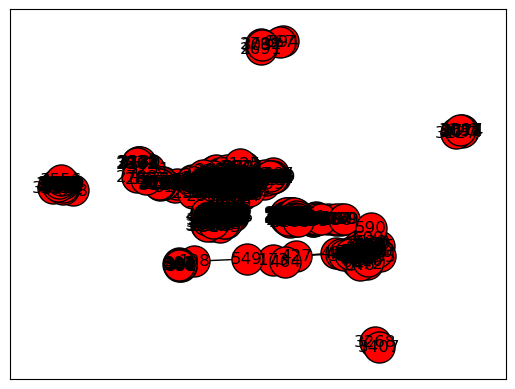

687
 	 node 687 is connected with :688
 	 node 687 is connected with :718
 	 node 687 is connected with :728
 	 node 687 is connected with :730
 	 node 687 is connected with :739
 	 node 687 is connected with :759
 	 node 687 is connected with :764
 	 node 687 is connected with :765
 	 node 687 is connected with :777
 	 node 687 is connected with :779
 	 node 687 is connected with :780
 	 node 687 is connected with :783
 	 node 687 is connected with :797
 	 node 687 is connected with :807
 	 node 687 is connected with :817
 	 node 687 is connected with :820
 	 node 687 is connected with :838
688
 	 node 688 is connected with :687
 	 node 688 is connected with :694
 	 node 688 is connected with :695
 	 node 688 is connected with :696
 	 node 688 is connected with :701
 	 node 688 is connected with :723
 	 node 688 is connected with :724
 	 node 688 is connected with :726
 	 node 688 is connected with :727
 	 node 688 is connected with :734
 	 node 688 is connected with :739
 	 node 688 

768
 	 node 768 is connected with :707
 	 node 768 is connected with :712
 	 node 768 is connected with :722
 	 node 768 is connected with :733
 	 node 768 is connected with :742
 	 node 768 is connected with :767
 	 node 768 is connected with :786
 	 node 768 is connected with :789
 	 node 768 is connected with :816
 	 node 768 is connected with :822
 	 node 768 is connected with :833
 	 node 768 is connected with :839
770
 	 node 770 is connected with :688
 	 node 770 is connected with :704
 	 node 770 is connected with :705
 	 node 770 is connected with :716
 	 node 770 is connected with :718
 	 node 770 is connected with :723
 	 node 770 is connected with :727
 	 node 770 is connected with :734
 	 node 770 is connected with :740
 	 node 770 is connected with :741
 	 node 770 is connected with :748
 	 node 770 is connected with :750
 	 node 770 is connected with :763
 	 node 770 is connected with :777
 	 node 770 is connected with :781
 	 node 770 is connected with :783
 	 node 770 

 	 node 853 is connected with :722
 	 node 853 is connected with :724
 	 node 853 is connected with :726
 	 node 853 is connected with :727
 	 node 853 is connected with :731
 	 node 853 is connected with :734
 	 node 853 is connected with :738
 	 node 853 is connected with :752
 	 node 853 is connected with :766
 	 node 853 is connected with :773
 	 node 853 is connected with :781
 	 node 853 is connected with :784
 	 node 853 is connected with :795
 	 node 853 is connected with :814
 	 node 853 is connected with :815
 	 node 853 is connected with :820
 	 node 853 is connected with :824
 	 node 853 is connected with :827
 	 node 853 is connected with :829
 	 node 853 is connected with :831
 	 node 853 is connected with :834
 	 node 853 is connected with :836
 	 node 853 is connected with :842
 	 node 853 is connected with :847
854
 	 node 854 is connected with :727
 	 node 854 is connected with :784
855
 	 node 855 is connected with :717
 	 node 855 is connected with :852
3981
 	 node

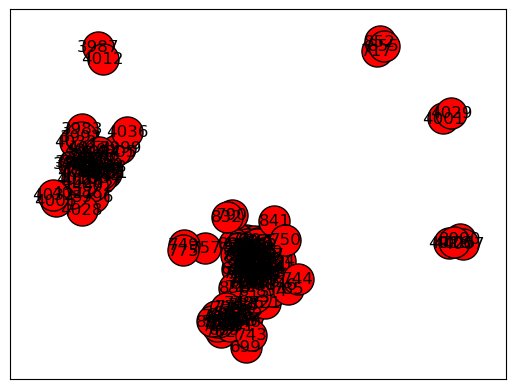

0
 	 node 0 is connected with :34
 	 node 0 is connected with :58
 	 node 0 is connected with :171
34
 	 node 34 is connected with :0
 	 node 34 is connected with :348
 	 node 34 is connected with :414
 	 node 34 is connected with :428
58
 	 node 58 is connected with :0
 	 node 58 is connected with :171
 	 node 58 is connected with :2814
 	 node 58 is connected with :2838
 	 node 58 is connected with :2885
 	 node 58 is connected with :3003
 	 node 58 is connected with :3173
 	 node 58 is connected with :3290
171
 	 node 171 is connected with :0
 	 node 171 is connected with :58
 	 node 171 is connected with :904
 	 node 171 is connected with :1171
 	 node 171 is connected with :1193
 	 node 171 is connected with :1297
 	 node 171 is connected with :1387
 	 node 171 is connected with :1486
 	 node 171 is connected with :1549
 	 node 171 is connected with :2838
 	 node 171 is connected with :2885
 	 node 171 is connected with :3003
 	 node 171 is connected with :3290
348
 	 node 348 is 

 	 node 896 is connected with :1550
 	 node 896 is connected with :1573
 	 node 896 is connected with :1576
 	 node 896 is connected with :1578
 	 node 896 is connected with :1583
 	 node 896 is connected with :1587
 	 node 896 is connected with :1591
 	 node 896 is connected with :1595
 	 node 896 is connected with :1596
 	 node 896 is connected with :1611
 	 node 896 is connected with :1628
 	 node 896 is connected with :1635
 	 node 896 is connected with :1636
 	 node 896 is connected with :1638
 	 node 896 is connected with :1647
 	 node 896 is connected with :1661
 	 node 896 is connected with :1680
 	 node 896 is connected with :1691
 	 node 896 is connected with :1706
 	 node 896 is connected with :1715
 	 node 896 is connected with :1716
 	 node 896 is connected with :1720
 	 node 896 is connected with :1728
 	 node 896 is connected with :1732
 	 node 896 is connected with :1742
 	 node 896 is connected with :1751
 	 node 896 is connected with :1764
 	 node 896 is connected wit

 	 node 955 is connected with :1197
 	 node 955 is connected with :1254
 	 node 955 is connected with :1368
 	 node 955 is connected with :1788
956
 	 node 956 is connected with :979
 	 node 956 is connected with :1016
 	 node 956 is connected with :1138
 	 node 956 is connected with :1177
 	 node 956 is connected with :1218
 	 node 956 is connected with :1403
 	 node 956 is connected with :1499
 	 node 956 is connected with :1548
 	 node 956 is connected with :1889
957
 	 node 957 is connected with :637
 	 node 957 is connected with :896
 	 node 957 is connected with :902
 	 node 957 is connected with :917
 	 node 957 is connected with :975
 	 node 957 is connected with :981
 	 node 957 is connected with :1036
 	 node 957 is connected with :1060
 	 node 957 is connected with :1066
 	 node 957 is connected with :1067
 	 node 957 is connected with :1082
 	 node 957 is connected with :1104
 	 node 957 is connected with :1120
 	 node 957 is connected with :1148
 	 node 957 is connected wi

 	 node 1025 is connected with :348
 	 node 1025 is connected with :483
 	 node 1025 is connected with :517
 	 node 1025 is connected with :538
 	 node 1025 is connected with :580
 	 node 1025 is connected with :637
 	 node 1025 is connected with :948
 	 node 1025 is connected with :1080
 	 node 1025 is connected with :1113
 	 node 1025 is connected with :1189
 	 node 1025 is connected with :1237
 	 node 1025 is connected with :1324
 	 node 1025 is connected with :1332
 	 node 1025 is connected with :1334
 	 node 1025 is connected with :1427
 	 node 1025 is connected with :1429
 	 node 1025 is connected with :1464
 	 node 1025 is connected with :1487
 	 node 1025 is connected with :1526
 	 node 1025 is connected with :1536
 	 node 1025 is connected with :1545
 	 node 1025 is connected with :1696
 	 node 1025 is connected with :1794
 	 node 1025 is connected with :1800
 	 node 1025 is connected with :1844
 	 node 1025 is connected with :1853
 	 node 1025 is connected with :1897
 	 node 

 	 node 1079 is connected with :1741
 	 node 1079 is connected with :1746
 	 node 1079 is connected with :1750
 	 node 1079 is connected with :1752
 	 node 1079 is connected with :1757
 	 node 1079 is connected with :1761
 	 node 1079 is connected with :1768
 	 node 1079 is connected with :1791
 	 node 1079 is connected with :1793
 	 node 1079 is connected with :1795
 	 node 1079 is connected with :1796
 	 node 1079 is connected with :1800
 	 node 1079 is connected with :1804
 	 node 1079 is connected with :1810
 	 node 1079 is connected with :1813
 	 node 1079 is connected with :1816
 	 node 1079 is connected with :1819
 	 node 1079 is connected with :1827
 	 node 1079 is connected with :1833
 	 node 1079 is connected with :1835
 	 node 1079 is connected with :1839
 	 node 1079 is connected with :1849
 	 node 1079 is connected with :1867
 	 node 1079 is connected with :1879
 	 node 1079 is connected with :1888
1080
 	 node 1080 is connected with :353
 	 node 1080 is connected with :36

1141
 	 node 1141 is connected with :924
 	 node 1141 is connected with :1010
 	 node 1141 is connected with :1090
 	 node 1141 is connected with :1188
 	 node 1141 is connected with :1228
 	 node 1141 is connected with :1236
 	 node 1141 is connected with :1304
 	 node 1141 is connected with :1308
 	 node 1141 is connected with :1310
 	 node 1141 is connected with :1355
 	 node 1141 is connected with :1366
 	 node 1141 is connected with :1634
 	 node 1141 is connected with :1667
 	 node 1141 is connected with :1703
 	 node 1141 is connected with :1709
 	 node 1141 is connected with :1725
 	 node 1141 is connected with :1785
1142
 	 node 1142 is connected with :366
 	 node 1142 is connected with :483
 	 node 1142 is connected with :580
 	 node 1142 is connected with :637
 	 node 1142 is connected with :915
 	 node 1142 is connected with :930
 	 node 1142 is connected with :948
 	 node 1142 is connected with :962
 	 node 1142 is connected with :1080
 	 node 1142 is connected with :1113


1191
 	 node 1191 is connected with :526
 	 node 1191 is connected with :897
 	 node 1191 is connected with :916
 	 node 1191 is connected with :926
 	 node 1191 is connected with :932
 	 node 1191 is connected with :953
 	 node 1191 is connected with :966
 	 node 1191 is connected with :978
 	 node 1191 is connected with :980
 	 node 1191 is connected with :993
 	 node 1191 is connected with :997
 	 node 1191 is connected with :1003
 	 node 1191 is connected with :1006
 	 node 1191 is connected with :1047
 	 node 1191 is connected with :1048
 	 node 1191 is connected with :1049
 	 node 1191 is connected with :1056
 	 node 1191 is connected with :1059
 	 node 1191 is connected with :1074
 	 node 1191 is connected with :1078
 	 node 1191 is connected with :1101
 	 node 1191 is connected with :1107
 	 node 1191 is connected with :1110
 	 node 1191 is connected with :1117
 	 node 1191 is connected with :1124
 	 node 1191 is connected with :1125
 	 node 1191 is connected with :1126
 	 node

 	 node 1243 is connected with :1420
 	 node 1243 is connected with :1431
 	 node 1243 is connected with :1451
 	 node 1243 is connected with :1483
 	 node 1243 is connected with :1497
 	 node 1243 is connected with :1509
 	 node 1243 is connected with :1522
 	 node 1243 is connected with :1528
 	 node 1243 is connected with :1530
 	 node 1243 is connected with :1554
 	 node 1243 is connected with :1559
 	 node 1243 is connected with :1563
 	 node 1243 is connected with :1570
 	 node 1243 is connected with :1584
 	 node 1243 is connected with :1589
 	 node 1243 is connected with :1590
 	 node 1243 is connected with :1604
 	 node 1243 is connected with :1608
 	 node 1243 is connected with :1609
 	 node 1243 is connected with :1610
 	 node 1243 is connected with :1612
 	 node 1243 is connected with :1613
 	 node 1243 is connected with :1620
 	 node 1243 is connected with :1621
 	 node 1243 is connected with :1623
 	 node 1243 is connected with :1637
 	 node 1243 is connected with :1639
 

 	 node 1280 is connected with :1804
 	 node 1280 is connected with :1809
 	 node 1280 is connected with :1813
 	 node 1280 is connected with :1832
 	 node 1280 is connected with :1835
 	 node 1280 is connected with :1839
 	 node 1280 is connected with :1842
 	 node 1280 is connected with :1849
 	 node 1280 is connected with :1861
 	 node 1280 is connected with :1868
 	 node 1280 is connected with :1902
1281
 	 node 1281 is connected with :483
 	 node 1281 is connected with :917
 	 node 1281 is connected with :941
 	 node 1281 is connected with :954
 	 node 1281 is connected with :1014
 	 node 1281 is connected with :1018
 	 node 1281 is connected with :1021
 	 node 1281 is connected with :1032
 	 node 1281 is connected with :1066
 	 node 1281 is connected with :1108
 	 node 1281 is connected with :1245
 	 node 1281 is connected with :1261
 	 node 1281 is connected with :1282
 	 node 1281 is connected with :1309
 	 node 1281 is connected with :1373
 	 node 1281 is connected with :1396


 	 node 1332 is connected with :1025
 	 node 1332 is connected with :1080
 	 node 1332 is connected with :1113
 	 node 1332 is connected with :1142
 	 node 1332 is connected with :1147
 	 node 1332 is connected with :1210
 	 node 1332 is connected with :1237
 	 node 1332 is connected with :1318
 	 node 1332 is connected with :1320
 	 node 1332 is connected with :1358
 	 node 1332 is connected with :1427
 	 node 1332 is connected with :1446
 	 node 1332 is connected with :1464
 	 node 1332 is connected with :1487
 	 node 1332 is connected with :1543
 	 node 1332 is connected with :1549
 	 node 1332 is connected with :1565
 	 node 1332 is connected with :1606
 	 node 1332 is connected with :1625
 	 node 1332 is connected with :1628
 	 node 1332 is connected with :1645
 	 node 1332 is connected with :1660
 	 node 1332 is connected with :1695
 	 node 1332 is connected with :1763
 	 node 1332 is connected with :1766
 	 node 1332 is connected with :1773
 	 node 1332 is connected with :1801
 

1397
 	 node 1397 is connected with :353
 	 node 1397 is connected with :366
 	 node 1397 is connected with :483
 	 node 1397 is connected with :484
 	 node 1397 is connected with :1001
 	 node 1397 is connected with :1095
 	 node 1397 is connected with :1237
 	 node 1397 is connected with :1357
 	 node 1397 is connected with :1358
 	 node 1397 is connected with :1409
 	 node 1397 is connected with :1487
 	 node 1397 is connected with :1536
 	 node 1397 is connected with :1673
 	 node 1397 is connected with :1844
 	 node 1397 is connected with :1882
1398
 	 node 1398 is connected with :897
 	 node 1398 is connected with :922
 	 node 1398 is connected with :946
 	 node 1398 is connected with :960
 	 node 1398 is connected with :1006
 	 node 1398 is connected with :1017
 	 node 1398 is connected with :1024
 	 node 1398 is connected with :1083
 	 node 1398 is connected with :1092
 	 node 1398 is connected with :1101
 	 node 1398 is connected with :1123
 	 node 1398 is connected with :1124

 	 node 1461 is connected with :973
 	 node 1461 is connected with :995
 	 node 1461 is connected with :1165
 	 node 1461 is connected with :1178
 	 node 1461 is connected with :1369
 	 node 1461 is connected with :1505
 	 node 1461 is connected with :1758
1462
 	 node 1462 is connected with :896
 	 node 1462 is connected with :902
 	 node 1462 is connected with :941
 	 node 1462 is connected with :957
 	 node 1462 is connected with :975
 	 node 1462 is connected with :981
 	 node 1462 is connected with :988
 	 node 1462 is connected with :989
 	 node 1462 is connected with :1014
 	 node 1462 is connected with :1015
 	 node 1462 is connected with :1019
 	 node 1462 is connected with :1021
 	 node 1462 is connected with :1036
 	 node 1462 is connected with :1067
 	 node 1462 is connected with :1082
 	 node 1462 is connected with :1100
 	 node 1462 is connected with :1104
 	 node 1462 is connected with :1115
 	 node 1462 is connected with :1120
 	 node 1462 is connected with :1129
 	 nod

 	 node 1516 is connected with :1520
 	 node 1516 is connected with :1522
 	 node 1516 is connected with :1530
 	 node 1516 is connected with :1539
 	 node 1516 is connected with :1547
 	 node 1516 is connected with :1551
 	 node 1516 is connected with :1554
 	 node 1516 is connected with :1557
 	 node 1516 is connected with :1559
 	 node 1516 is connected with :1570
 	 node 1516 is connected with :1584
 	 node 1516 is connected with :1589
 	 node 1516 is connected with :1597
 	 node 1516 is connected with :1598
 	 node 1516 is connected with :1600
 	 node 1516 is connected with :1603
 	 node 1516 is connected with :1604
 	 node 1516 is connected with :1608
 	 node 1516 is connected with :1610
 	 node 1516 is connected with :1612
 	 node 1516 is connected with :1613
 	 node 1516 is connected with :1614
 	 node 1516 is connected with :1617
 	 node 1516 is connected with :1619
 	 node 1516 is connected with :1621
 	 node 1516 is connected with :1622
 	 node 1516 is connected with :1623
 

1563
 	 node 1563 is connected with :916
 	 node 1563 is connected with :921
 	 node 1563 is connected with :925
 	 node 1563 is connected with :927
 	 node 1563 is connected with :946
 	 node 1563 is connected with :947
 	 node 1563 is connected with :953
 	 node 1563 is connected with :967
 	 node 1563 is connected with :980
 	 node 1563 is connected with :997
 	 node 1563 is connected with :1003
 	 node 1563 is connected with :1017
 	 node 1563 is connected with :1048
 	 node 1563 is connected with :1059
 	 node 1563 is connected with :1076
 	 node 1563 is connected with :1086
 	 node 1563 is connected with :1107
 	 node 1563 is connected with :1124
 	 node 1563 is connected with :1126
 	 node 1563 is connected with :1146
 	 node 1563 is connected with :1149
 	 node 1563 is connected with :1156
 	 node 1563 is connected with :1184
 	 node 1563 is connected with :1185
 	 node 1563 is connected with :1191
 	 node 1563 is connected with :1195
 	 node 1563 is connected with :1196
 	 nod

1605
 	 node 1605 is connected with :916
 	 node 1605 is connected with :926
 	 node 1605 is connected with :932
 	 node 1605 is connected with :953
 	 node 1605 is connected with :966
 	 node 1605 is connected with :997
 	 node 1605 is connected with :1006
 	 node 1605 is connected with :1017
 	 node 1605 is connected with :1076
 	 node 1605 is connected with :1083
 	 node 1605 is connected with :1084
 	 node 1605 is connected with :1086
 	 node 1605 is connected with :1092
 	 node 1605 is connected with :1107
 	 node 1605 is connected with :1126
 	 node 1605 is connected with :1132
 	 node 1605 is connected with :1153
 	 node 1605 is connected with :1156
 	 node 1605 is connected with :1160
 	 node 1605 is connected with :1163
 	 node 1605 is connected with :1172
 	 node 1605 is connected with :1173
 	 node 1605 is connected with :1184
 	 node 1605 is connected with :1199
 	 node 1605 is connected with :1205
 	 node 1605 is connected with :1207
 	 node 1605 is connected with :1214
 	

1651
 	 node 1651 is connected with :995
 	 node 1651 is connected with :1730
 	 node 1651 is connected with :1768
1652
 	 node 1652 is connected with :906
 	 node 1652 is connected with :960
 	 node 1652 is connected with :966
 	 node 1652 is connected with :999
 	 node 1652 is connected with :1003
 	 node 1652 is connected with :1004
 	 node 1652 is connected with :1017
 	 node 1652 is connected with :1024
 	 node 1652 is connected with :1059
 	 node 1652 is connected with :1076
 	 node 1652 is connected with :1079
 	 node 1652 is connected with :1083
 	 node 1652 is connected with :1086
 	 node 1652 is connected with :1101
 	 node 1652 is connected with :1107
 	 node 1652 is connected with :1125
 	 node 1652 is connected with :1132
 	 node 1652 is connected with :1153
 	 node 1652 is connected with :1156
 	 node 1652 is connected with :1163
 	 node 1652 is connected with :1175
 	 node 1652 is connected with :1184
 	 node 1652 is connected with :1185
 	 node 1652 is connected with :1

 	 node 1704 is connected with :933
 	 node 1704 is connected with :941
 	 node 1704 is connected with :945
 	 node 1704 is connected with :969
 	 node 1704 is connected with :971
 	 node 1704 is connected with :1032
 	 node 1704 is connected with :1081
 	 node 1704 is connected with :1273
 	 node 1704 is connected with :1406
 	 node 1704 is connected with :1429
 	 node 1704 is connected with :1454
 	 node 1704 is connected with :1489
 	 node 1704 is connected with :1502
 	 node 1704 is connected with :1515
 	 node 1704 is connected with :1686
 	 node 1704 is connected with :1706
 	 node 1704 is connected with :1729
 	 node 1704 is connected with :1742
 	 node 1704 is connected with :1786
 	 node 1704 is connected with :1794
 	 node 1704 is connected with :1820
 	 node 1704 is connected with :1850
 	 node 1704 is connected with :1871
 	 node 1704 is connected with :1894
1705
 	 node 1705 is connected with :928
 	 node 1705 is connected with :1085
 	 node 1705 is connected with :1098
 	

 	 node 1735 is connected with :1736
 	 node 1735 is connected with :1746
 	 node 1735 is connected with :1750
 	 node 1735 is connected with :1752
 	 node 1735 is connected with :1753
 	 node 1735 is connected with :1757
 	 node 1735 is connected with :1761
 	 node 1735 is connected with :1768
 	 node 1735 is connected with :1769
 	 node 1735 is connected with :1774
 	 node 1735 is connected with :1799
 	 node 1735 is connected with :1800
 	 node 1735 is connected with :1804
 	 node 1735 is connected with :1810
 	 node 1735 is connected with :1823
 	 node 1735 is connected with :1827
 	 node 1735 is connected with :1833
 	 node 1735 is connected with :1835
 	 node 1735 is connected with :1836
 	 node 1735 is connected with :1839
 	 node 1735 is connected with :1845
 	 node 1735 is connected with :1849
 	 node 1735 is connected with :1851
 	 node 1735 is connected with :1867
 	 node 1735 is connected with :1877
 	 node 1735 is connected with :1886
 	 node 1735 is connected with :1888
1

 	 node 1796 is connected with :906
 	 node 1796 is connected with :916
 	 node 1796 is connected with :925
 	 node 1796 is connected with :967
 	 node 1796 is connected with :993
 	 node 1796 is connected with :1004
 	 node 1796 is connected with :1059
 	 node 1796 is connected with :1076
 	 node 1796 is connected with :1079
 	 node 1796 is connected with :1107
 	 node 1796 is connected with :1112
 	 node 1796 is connected with :1146
 	 node 1796 is connected with :1149
 	 node 1796 is connected with :1153
 	 node 1796 is connected with :1199
 	 node 1796 is connected with :1205
 	 node 1796 is connected with :1209
 	 node 1796 is connected with :1242
 	 node 1796 is connected with :1250
 	 node 1796 is connected with :1256
 	 node 1796 is connected with :1267
 	 node 1796 is connected with :1290
 	 node 1796 is connected with :1293
 	 node 1796 is connected with :1335
 	 node 1796 is connected with :1339
 	 node 1796 is connected with :1344
 	 node 1796 is connected with :1359
 	 nod

 	 node 1839 is connected with :1539
 	 node 1839 is connected with :1542
 	 node 1839 is connected with :1547
 	 node 1839 is connected with :1551
 	 node 1839 is connected with :1554
 	 node 1839 is connected with :1559
 	 node 1839 is connected with :1563
 	 node 1839 is connected with :1570
 	 node 1839 is connected with :1571
 	 node 1839 is connected with :1580
 	 node 1839 is connected with :1584
 	 node 1839 is connected with :1589
 	 node 1839 is connected with :1598
 	 node 1839 is connected with :1603
 	 node 1839 is connected with :1604
 	 node 1839 is connected with :1605
 	 node 1839 is connected with :1608
 	 node 1839 is connected with :1610
 	 node 1839 is connected with :1612
 	 node 1839 is connected with :1619
 	 node 1839 is connected with :1621
 	 node 1839 is connected with :1622
 	 node 1839 is connected with :1639
 	 node 1839 is connected with :1662
 	 node 1839 is connected with :1663
 	 node 1839 is connected with :1665
 	 node 1839 is connected with :1668
 

1877
 	 node 1877 is connected with :906
 	 node 1877 is connected with :925
 	 node 1877 is connected with :993
 	 node 1877 is connected with :1003
 	 node 1877 is connected with :1004
 	 node 1877 is connected with :1049
 	 node 1877 is connected with :1059
 	 node 1877 is connected with :1075
 	 node 1877 is connected with :1076
 	 node 1877 is connected with :1086
 	 node 1877 is connected with :1117
 	 node 1877 is connected with :1146
 	 node 1877 is connected with :1184
 	 node 1877 is connected with :1242
 	 node 1877 is connected with :1250
 	 node 1877 is connected with :1305
 	 node 1877 is connected with :1340
 	 node 1877 is connected with :1367
 	 node 1877 is connected with :1390
 	 node 1877 is connected with :1391
 	 node 1877 is connected with :1416
 	 node 1877 is connected with :1431
 	 node 1877 is connected with :1435
 	 node 1877 is connected with :1520
 	 node 1877 is connected with :1522
 	 node 1877 is connected with :1523
 	 node 1877 is connected with :1539

497
 	 node 497 is connected with :348
 	 node 497 is connected with :353
 	 node 497 is connected with :360
 	 node 497 is connected with :363
 	 node 497 is connected with :366
 	 node 497 is connected with :370
 	 node 497 is connected with :373
 	 node 497 is connected with :374
 	 node 497 is connected with :376
 	 node 497 is connected with :389
 	 node 497 is connected with :391
 	 node 497 is connected with :392
 	 node 497 is connected with :395
 	 node 497 is connected with :400
 	 node 497 is connected with :402
 	 node 497 is connected with :416
 	 node 497 is connected with :417
 	 node 497 is connected with :423
 	 node 497 is connected with :428
 	 node 497 is connected with :456
 	 node 497 is connected with :460
 	 node 497 is connected with :461
 	 node 497 is connected with :475
 	 node 497 is connected with :483
 	 node 497 is connected with :484
 	 node 497 is connected with :492
 	 node 497 is connected with :513
 	 node 497 is connected with :517
 	 node 497 is c

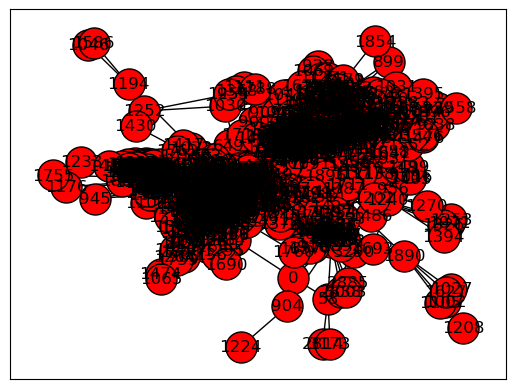

107
 	 node 107 is connected with :1684
1684
 	 node 1684 is connected with :107
1912
3437
Done adding k_3


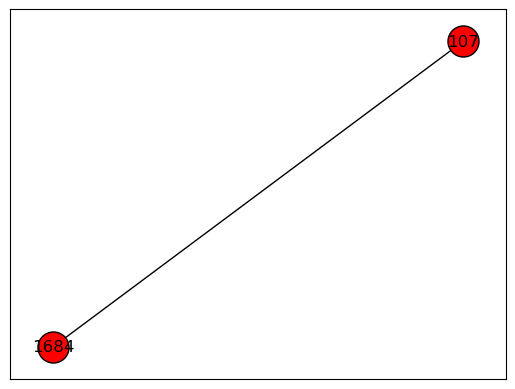

2543
 	 node 2543 is connected with :1917
 	 node 2543 is connected with :1918
 	 node 2543 is connected with :1925
 	 node 2543 is connected with :1938
 	 node 2543 is connected with :1941
 	 node 2543 is connected with :1943
 	 node 2543 is connected with :1946
 	 node 2543 is connected with :1953
 	 node 2543 is connected with :1962
 	 node 2543 is connected with :1971
 	 node 2543 is connected with :1979
 	 node 2543 is connected with :1983
 	 node 2543 is connected with :1984
 	 node 2543 is connected with :1985
 	 node 2543 is connected with :1989
 	 node 2543 is connected with :1993
 	 node 2543 is connected with :1997
 	 node 2543 is connected with :2005
 	 node 2543 is connected with :2020
 	 node 2543 is connected with :2030
 	 node 2543 is connected with :2033
 	 node 2543 is connected with :2037
 	 node 2543 is connected with :2040
 	 node 2543 is connected with :2043
 	 node 2543 is connected with :2045
 	 node 2543 is connected with :2046
 	 node 2543 is connected with :2

 	 node 1929 is connected with :2369
 	 node 1929 is connected with :2370
 	 node 1929 is connected with :2374
 	 node 1929 is connected with :2376
 	 node 1929 is connected with :2381
 	 node 1929 is connected with :2392
 	 node 1929 is connected with :2395
 	 node 1929 is connected with :2408
 	 node 1929 is connected with :2409
 	 node 1929 is connected with :2410
 	 node 1929 is connected with :2414
 	 node 1929 is connected with :2418
 	 node 1929 is connected with :2423
 	 node 1929 is connected with :2428
 	 node 1929 is connected with :2430
 	 node 1929 is connected with :2433
 	 node 1929 is connected with :2446
 	 node 1929 is connected with :2462
 	 node 1929 is connected with :2464
 	 node 1929 is connected with :2467
 	 node 1929 is connected with :2468
 	 node 1929 is connected with :2482
 	 node 1929 is connected with :2484
 	 node 1929 is connected with :2485
 	 node 1929 is connected with :2492
 	 node 1929 is connected with :2500
 	 node 1929 is connected with :2504
 

 	 node 2088 is connected with :2165
 	 node 2088 is connected with :2172
 	 node 2088 is connected with :2184
 	 node 2088 is connected with :2188
 	 node 2088 is connected with :2190
 	 node 2088 is connected with :2200
 	 node 2088 is connected with :2201
 	 node 2088 is connected with :2206
 	 node 2088 is connected with :2212
 	 node 2088 is connected with :2213
 	 node 2088 is connected with :2216
 	 node 2088 is connected with :2218
 	 node 2088 is connected with :2220
 	 node 2088 is connected with :2229
 	 node 2088 is connected with :2233
 	 node 2088 is connected with :2237
 	 node 2088 is connected with :2240
 	 node 2088 is connected with :2244
 	 node 2088 is connected with :2253
 	 node 2088 is connected with :2257
 	 node 2088 is connected with :2261
 	 node 2088 is connected with :2266
 	 node 2088 is connected with :2271
 	 node 2088 is connected with :2275
 	 node 2088 is connected with :2276
 	 node 2088 is connected with :2278
 	 node 2088 is connected with :2290
 

 	 node 2112 is connected with :2464
 	 node 2112 is connected with :2468
 	 node 2112 is connected with :2477
 	 node 2112 is connected with :2482
 	 node 2112 is connected with :2484
 	 node 2112 is connected with :2485
 	 node 2112 is connected with :2492
 	 node 2112 is connected with :2495
 	 node 2112 is connected with :2499
 	 node 2112 is connected with :2500
 	 node 2112 is connected with :2504
 	 node 2112 is connected with :2506
 	 node 2112 is connected with :2507
 	 node 2112 is connected with :2520
 	 node 2112 is connected with :2521
 	 node 2112 is connected with :2526
 	 node 2112 is connected with :2539
 	 node 2112 is connected with :2542
 	 node 2112 is connected with :2543
 	 node 2112 is connected with :2546
 	 node 2112 is connected with :2549
 	 node 2112 is connected with :2550
 	 node 2112 is connected with :2551
 	 node 2112 is connected with :2552
 	 node 2112 is connected with :2553
 	 node 2112 is connected with :2554
 	 node 2112 is connected with :2559
 

 	 node 2240 is connected with :2631
 	 node 2240 is connected with :2638
 	 node 2240 is connected with :2646
 	 node 2240 is connected with :2654
 	 node 2240 is connected with :2655
2244
 	 node 2244 is connected with :1917
 	 node 2244 is connected with :1918
 	 node 2244 is connected with :1925
 	 node 2244 is connected with :1929
 	 node 2244 is connected with :1938
 	 node 2244 is connected with :1941
 	 node 2244 is connected with :1943
 	 node 2244 is connected with :1946
 	 node 2244 is connected with :1953
 	 node 2244 is connected with :1962
 	 node 2244 is connected with :1963
 	 node 2244 is connected with :1966
 	 node 2244 is connected with :1971
 	 node 2244 is connected with :1983
 	 node 2244 is connected with :1984
 	 node 2244 is connected with :1985
 	 node 2244 is connected with :1986
 	 node 2244 is connected with :1989
 	 node 2244 is connected with :1993
 	 node 2244 is connected with :1997
 	 node 2244 is connected with :2005
 	 node 2244 is connected with :2

 	 node 2276 is connected with :1918
 	 node 2276 is connected with :1938
 	 node 2276 is connected with :1941
 	 node 2276 is connected with :1943
 	 node 2276 is connected with :1946
 	 node 2276 is connected with :1962
 	 node 2276 is connected with :1966
 	 node 2276 is connected with :1971
 	 node 2276 is connected with :1979
 	 node 2276 is connected with :1983
 	 node 2276 is connected with :1984
 	 node 2276 is connected with :1986
 	 node 2276 is connected with :1989
 	 node 2276 is connected with :1993
 	 node 2276 is connected with :1997
 	 node 2276 is connected with :2005
 	 node 2276 is connected with :2020
 	 node 2276 is connected with :2030
 	 node 2276 is connected with :2033
 	 node 2276 is connected with :2040
 	 node 2276 is connected with :2043
 	 node 2276 is connected with :2045
 	 node 2276 is connected with :2046
 	 node 2276 is connected with :2059
 	 node 2276 is connected with :2064
 	 node 2276 is connected with :2069
 	 node 2276 is connected with :2073
 

 	 node 2428 is connected with :2552
 	 node 2428 is connected with :2553
 	 node 2428 is connected with :2554
 	 node 2428 is connected with :2559
 	 node 2428 is connected with :2560
 	 node 2428 is connected with :2561
 	 node 2428 is connected with :2563
 	 node 2428 is connected with :2564
 	 node 2428 is connected with :2573
 	 node 2428 is connected with :2575
 	 node 2428 is connected with :2578
 	 node 2428 is connected with :2586
 	 node 2428 is connected with :2590
 	 node 2428 is connected with :2591
 	 node 2428 is connected with :2593
 	 node 2428 is connected with :2600
 	 node 2428 is connected with :2601
 	 node 2428 is connected with :2602
 	 node 2428 is connected with :2604
 	 node 2428 is connected with :2607
 	 node 2428 is connected with :2611
 	 node 2428 is connected with :2615
 	 node 2428 is connected with :2623
 	 node 2428 is connected with :2624
 	 node 2428 is connected with :2625
 	 node 2428 is connected with :2630
 	 node 2428 is connected with :2638
 

 	 node 2433 is connected with :2244
 	 node 2433 is connected with :2253
 	 node 2433 is connected with :2266
 	 node 2433 is connected with :2271
 	 node 2433 is connected with :2275
 	 node 2433 is connected with :2278
 	 node 2433 is connected with :2290
 	 node 2433 is connected with :2299
 	 node 2433 is connected with :2307
 	 node 2433 is connected with :2309
 	 node 2433 is connected with :2323
 	 node 2433 is connected with :2324
 	 node 2433 is connected with :2329
 	 node 2433 is connected with :2331
 	 node 2433 is connected with :2334
 	 node 2433 is connected with :2339
 	 node 2433 is connected with :2340
 	 node 2433 is connected with :2347
 	 node 2433 is connected with :2352
 	 node 2433 is connected with :2356
 	 node 2433 is connected with :2359
 	 node 2433 is connected with :2363
 	 node 2433 is connected with :2369
 	 node 2433 is connected with :2374
 	 node 2433 is connected with :2376
 	 node 2433 is connected with :2381
 	 node 2433 is connected with :2395
 

 	 node 2601 is connected with :2123
 	 node 2601 is connected with :2124
 	 node 2601 is connected with :2131
 	 node 2601 is connected with :2139
 	 node 2601 is connected with :2140
 	 node 2601 is connected with :2142
 	 node 2601 is connected with :2150
 	 node 2601 is connected with :2154
 	 node 2601 is connected with :2164
 	 node 2601 is connected with :2165
 	 node 2601 is connected with :2172
 	 node 2601 is connected with :2179
 	 node 2601 is connected with :2184
 	 node 2601 is connected with :2188
 	 node 2601 is connected with :2190
 	 node 2601 is connected with :2200
 	 node 2601 is connected with :2201
 	 node 2601 is connected with :2206
 	 node 2601 is connected with :2210
 	 node 2601 is connected with :2212
 	 node 2601 is connected with :2218
 	 node 2601 is connected with :2220
 	 node 2601 is connected with :2229
 	 node 2601 is connected with :2233
 	 node 2601 is connected with :2237
 	 node 2601 is connected with :2240
 	 node 2601 is connected with :2244
 

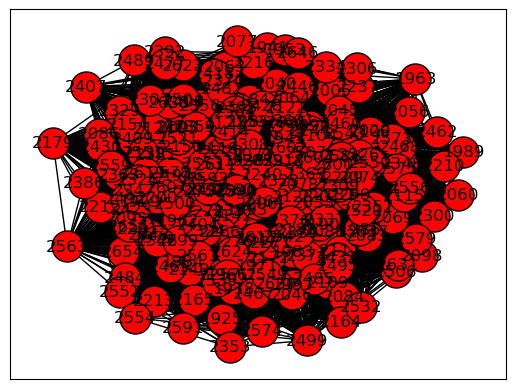

3980
 	 node 3980 is connected with :3989
 	 node 3980 is connected with :4011
 	 node 3980 is connected with :4031
3989
 	 node 3989 is connected with :3980
 	 node 3989 is connected with :4011
4011
 	 node 4011 is connected with :3980
 	 node 4011 is connected with :3989
 	 node 4011 is connected with :4031
4031
 	 node 4031 is connected with :3980
 	 node 4031 is connected with :4011
686
 	 node 686 is connected with :697
 	 node 686 is connected with :703
 	 node 686 is connected with :708
 	 node 686 is connected with :713
 	 node 686 is connected with :719
 	 node 686 is connected with :729
 	 node 686 is connected with :745
 	 node 686 is connected with :747
 	 node 686 is connected with :753
 	 node 686 is connected with :769
 	 node 686 is connected with :772
 	 node 686 is connected with :774
 	 node 686 is connected with :776
 	 node 686 is connected with :798
 	 node 686 is connected with :800
 	 node 686 is connected with :803
 	 node 686 is connected with :804
 	 node 686

893
 	 node 893 is connected with :856
 	 node 893 is connected with :864
 	 node 893 is connected with :884
894
 	 node 894 is connected with :866
 	 node 894 is connected with :870
 	 node 894 is connected with :879
895
 	 node 895 is connected with :858
 	 node 895 is connected with :866
 	 node 895 is connected with :870
 	 node 895 is connected with :871
 	 node 895 is connected with :881
3586
 	 node 3586 is connected with :3438
 	 node 3586 is connected with :3448
 	 node 3586 is connected with :3449
 	 node 3586 is connected with :3475
 	 node 3586 is connected with :3480
 	 node 3586 is connected with :3491
 	 node 3586 is connected with :3517
 	 node 3586 is connected with :3545
 	 node 3586 is connected with :3596
 	 node 3586 is connected with :3604
 	 node 3586 is connected with :3693
 	 node 3586 is connected with :3697
 	 node 3586 is connected with :3712
 	 node 3586 is connected with :3734
 	 node 3586 is connected with :3760
 	 node 3586 is connected with :3765
 	 nod

 	 node 3477 is connected with :3565
 	 node 3477 is connected with :3637
 	 node 3477 is connected with :3847
3478
 	 node 3478 is connected with :3500
 	 node 3478 is connected with :3587
 	 node 3478 is connected with :3607
 	 node 3478 is connected with :3655
 	 node 3478 is connected with :3696
 	 node 3478 is connected with :3747
 	 node 3478 is connected with :3766
 	 node 3478 is connected with :3776
 	 node 3478 is connected with :3783
 	 node 3478 is connected with :3791
 	 node 3478 is connected with :3809
 	 node 3478 is connected with :3920
 	 node 3478 is connected with :3933
 	 node 3478 is connected with :3960
 	 node 3478 is connected with :3964
 	 node 3478 is connected with :3967
3479
 	 node 3479 is connected with :3481
 	 node 3479 is connected with :3516
 	 node 3479 is connected with :3523
 	 node 3479 is connected with :3562
 	 node 3479 is connected with :3581
 	 node 3479 is connected with :3594
 	 node 3479 is connected with :3613
 	 node 3479 is connected wi

 	 node 3543 is connected with :3471
 	 node 3543 is connected with :3475
 	 node 3543 is connected with :3497
 	 node 3543 is connected with :3526
 	 node 3543 is connected with :3542
 	 node 3543 is connected with :3576
 	 node 3543 is connected with :3605
 	 node 3543 is connected with :3859
 	 node 3543 is connected with :3940
3544
 	 node 3544 is connected with :3775
 	 node 3544 is connected with :3808
 	 node 3544 is connected with :3888
3545
 	 node 3545 is connected with :3438
 	 node 3545 is connected with :3448
 	 node 3545 is connected with :3449
 	 node 3545 is connected with :3450
 	 node 3545 is connected with :3452
 	 node 3545 is connected with :3471
 	 node 3545 is connected with :3475
 	 node 3545 is connected with :3480
 	 node 3545 is connected with :3488
 	 node 3545 is connected with :3491
 	 node 3545 is connected with :3497
 	 node 3545 is connected with :3514
 	 node 3545 is connected with :3518
 	 node 3545 is connected with :3527
 	 node 3545 is connected wi

 	 node 3616 is connected with :3439
 	 node 3616 is connected with :3513
 	 node 3616 is connected with :3638
 	 node 3616 is connected with :3647
 	 node 3616 is connected with :3699
 	 node 3616 is connected with :3716
 	 node 3616 is connected with :3799
 	 node 3616 is connected with :3844
 	 node 3616 is connected with :3848
 	 node 3616 is connected with :3918
 	 node 3616 is connected with :3932
3617
 	 node 3617 is connected with :3464
 	 node 3617 is connected with :3483
 	 node 3617 is connected with :3499
 	 node 3617 is connected with :3532
 	 node 3617 is connected with :3534
 	 node 3617 is connected with :3555
 	 node 3617 is connected with :3564
 	 node 3617 is connected with :3568
 	 node 3617 is connected with :3584
 	 node 3617 is connected with :3604
 	 node 3617 is connected with :3622
 	 node 3617 is connected with :3645
 	 node 3617 is connected with :3680
 	 node 3617 is connected with :3690
 	 node 3617 is connected with :3719
 	 node 3617 is connected with :3

 	 node 3681 is connected with :3485
 	 node 3681 is connected with :3528
 	 node 3681 is connected with :3545
 	 node 3681 is connected with :3559
 	 node 3681 is connected with :3596
 	 node 3681 is connected with :3627
 	 node 3681 is connected with :3707
 	 node 3681 is connected with :3790
 	 node 3681 is connected with :3804
3682
 	 node 3682 is connected with :3447
 	 node 3682 is connected with :3490
 	 node 3682 is connected with :3536
 	 node 3682 is connected with :3549
 	 node 3682 is connected with :3662
 	 node 3682 is connected with :3812
 	 node 3682 is connected with :3814
 	 node 3682 is connected with :3949
3683
 	 node 3683 is connected with :3563
 	 node 3683 is connected with :3578
 	 node 3683 is connected with :3656
 	 node 3683 is connected with :3667
 	 node 3683 is connected with :3790
 	 node 3683 is connected with :3842
 	 node 3683 is connected with :3944
 	 node 3683 is connected with :3968
3685
 	 node 3685 is connected with :3442
 	 node 3685 is connect

 	 node 3735 is connected with :3629
 	 node 3735 is connected with :3636
 	 node 3735 is connected with :3663
 	 node 3735 is connected with :3710
 	 node 3735 is connected with :3713
 	 node 3735 is connected with :3728
 	 node 3735 is connected with :3740
 	 node 3735 is connected with :3753
 	 node 3735 is connected with :3867
 	 node 3735 is connected with :3921
3736
 	 node 3736 is connected with :3667
 	 node 3736 is connected with :3731
 	 node 3736 is connected with :3785
 	 node 3736 is connected with :3831
 	 node 3736 is connected with :3842
 	 node 3736 is connected with :3873
 	 node 3736 is connected with :3938
 	 node 3736 is connected with :3968
3737
 	 node 3737 is connected with :3448
 	 node 3737 is connected with :3449
 	 node 3737 is connected with :3450
 	 node 3737 is connected with :3488
 	 node 3737 is connected with :3512
 	 node 3737 is connected with :3514
 	 node 3737 is connected with :3518
 	 node 3737 is connected with :3528
 	 node 3737 is connected wi

 	 node 3810 is connected with :3711
 	 node 3810 is connected with :3718
 	 node 3810 is connected with :3719
 	 node 3810 is connected with :3758
 	 node 3810 is connected with :3763
 	 node 3810 is connected with :3764
 	 node 3810 is connected with :3768
 	 node 3810 is connected with :3782
 	 node 3810 is connected with :3786
 	 node 3810 is connected with :3793
 	 node 3810 is connected with :3833
 	 node 3810 is connected with :3855
 	 node 3810 is connected with :3881
 	 node 3810 is connected with :3896
 	 node 3810 is connected with :3906
 	 node 3810 is connected with :3924
 	 node 3810 is connected with :3947
 	 node 3810 is connected with :3951
3811
 	 node 3811 is connected with :3546
 	 node 3811 is connected with :3949
3812
 	 node 3812 is connected with :3459
 	 node 3812 is connected with :3536
 	 node 3812 is connected with :3549
 	 node 3812 is connected with :3662
 	 node 3812 is connected with :3682
 	 node 3812 is connected with :3745
3813
 	 node 3813 is connect

3857
 	 node 3857 is connected with :3473
 	 node 3857 is connected with :3538
 	 node 3857 is connected with :3567
 	 node 3857 is connected with :3595
 	 node 3857 is connected with :3628
 	 node 3857 is connected with :3657
 	 node 3857 is connected with :3725
 	 node 3857 is connected with :3743
 	 node 3857 is connected with :3868
 	 node 3857 is connected with :3917
3858
 	 node 3858 is connected with :3488
 	 node 3858 is connected with :3514
 	 node 3858 is connected with :3518
 	 node 3858 is connected with :3528
 	 node 3858 is connected with :3545
 	 node 3858 is connected with :3557
 	 node 3858 is connected with :3576
 	 node 3858 is connected with :3578
 	 node 3858 is connected with :3596
 	 node 3858 is connected with :3604
 	 node 3858 is connected with :3611
 	 node 3858 is connected with :3640
 	 node 3858 is connected with :3670
 	 node 3858 is connected with :3687
 	 node 3858 is connected with :3697
 	 node 3858 is connected with :3731
 	 node 3858 is connected wi

 	 node 3938 is connected with :3438
 	 node 3938 is connected with :3448
 	 node 3938 is connected with :3449
 	 node 3938 is connected with :3457
 	 node 3938 is connected with :3471
 	 node 3938 is connected with :3475
 	 node 3938 is connected with :3480
 	 node 3938 is connected with :3488
 	 node 3938 is connected with :3491
 	 node 3938 is connected with :3514
 	 node 3938 is connected with :3518
 	 node 3938 is connected with :3527
 	 node 3938 is connected with :3528
 	 node 3938 is connected with :3545
 	 node 3938 is connected with :3557
 	 node 3938 is connected with :3576
 	 node 3938 is connected with :3578
 	 node 3938 is connected with :3586
 	 node 3938 is connected with :3596
 	 node 3938 is connected with :3604
 	 node 3938 is connected with :3605
 	 node 3938 is connected with :3611
 	 node 3938 is connected with :3625
 	 node 3938 is connected with :3635
 	 node 3938 is connected with :3640
 	 node 3938 is connected with :3642
 	 node 3938 is connected with :3654
 

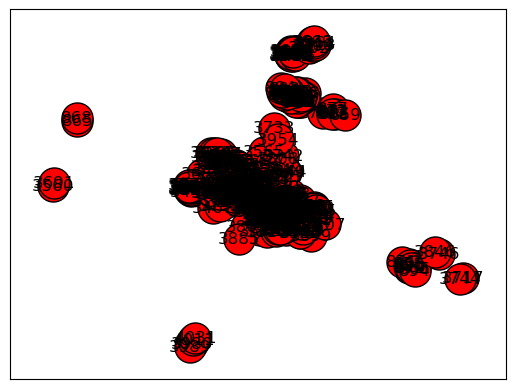

1
 	 node 1 is connected with :48
 	 node 1 is connected with :53
 	 node 1 is connected with :54
 	 node 1 is connected with :73
 	 node 1 is connected with :88
 	 node 1 is connected with :92
 	 node 1 is connected with :126
 	 node 1 is connected with :133
 	 node 1 is connected with :194
 	 node 1 is connected with :236
 	 node 1 is connected with :280
 	 node 1 is connected with :299
 	 node 1 is connected with :346
2
 	 node 2 is connected with :20
 	 node 2 is connected with :115
 	 node 2 is connected with :116
 	 node 2 is connected with :149
 	 node 2 is connected with :226
 	 node 2 is connected with :312
 	 node 2 is connected with :326
 	 node 2 is connected with :333
 	 node 2 is connected with :343
3
 	 node 3 is connected with :9
 	 node 3 is connected with :25
 	 node 3 is connected with :26
 	 node 3 is connected with :72
 	 node 3 is connected with :85
 	 node 3 is connected with :142
 	 node 3 is connected with :170
 	 node 3 is connected with :188
 	 node 3 is conn

71
 	 node 71 is connected with :230
 	 node 71 is connected with :307
72
 	 node 72 is connected with :3
 	 node 72 is connected with :9
 	 node 72 is connected with :25
 	 node 72 is connected with :26
 	 node 72 is connected with :40
 	 node 72 is connected with :113
 	 node 72 is connected with :132
 	 node 72 is connected with :141
 	 node 72 is connected with :165
 	 node 72 is connected with :172
 	 node 72 is connected with :199
 	 node 72 is connected with :200
 	 node 72 is connected with :212
 	 node 72 is connected with :232
 	 node 72 is connected with :239
 	 node 72 is connected with :252
 	 node 72 is connected with :271
 	 node 72 is connected with :272
 	 node 72 is connected with :291
 	 node 72 is connected with :298
 	 node 72 is connected with :329
73
 	 node 73 is connected with :1
 	 node 73 is connected with :25
 	 node 73 is connected with :30
 	 node 73 is connected with :48
 	 node 73 is connected with :88
 	 node 73 is connected with :126
 	 node 73 is conn

147
 	 node 147 is connected with :6
 	 node 147 is connected with :89
 	 node 147 is connected with :95
 	 node 147 is connected with :219
 	 node 147 is connected with :319
148
 	 node 148 is connected with :9
 	 node 148 is connected with :13
 	 node 148 is connected with :25
 	 node 148 is connected with :50
 	 node 148 is connected with :82
 	 node 148 is connected with :98
 	 node 148 is connected with :105
 	 node 148 is connected with :109
 	 node 148 is connected with :113
 	 node 148 is connected with :146
 	 node 148 is connected with :176
 	 node 148 is connected with :185
 	 node 148 is connected with :224
 	 node 148 is connected with :229
 	 node 148 is connected with :261
 	 node 148 is connected with :271
 	 node 148 is connected with :272
149
 	 node 149 is connected with :2
 	 node 149 is connected with :14
 	 node 149 is connected with :20
 	 node 149 is connected with :28
 	 node 149 is connected with :115
 	 node 149 is connected with :116
 	 node 149 is connected

219
 	 node 219 is connected with :6
 	 node 219 is connected with :89
 	 node 219 is connected with :147
 	 node 219 is connected with :154
 	 node 219 is connected with :319
220
 	 node 220 is connected with :115
 	 node 220 is connected with :262
 	 node 220 is connected with :312
221
 	 node 221 is connected with :25
 	 node 221 is connected with :45
 	 node 221 is connected with :186
 	 node 221 is connected with :303
222
 	 node 222 is connected with :82
 	 node 222 is connected with :118
 	 node 222 is connected with :186
 	 node 222 is connected with :199
 	 node 222 is connected with :211
 	 node 222 is connected with :238
 	 node 222 is connected with :240
 	 node 222 is connected with :313
 	 node 222 is connected with :325
223
 	 node 223 is connected with :13
 	 node 223 is connected with :26
 	 node 223 is connected with :62
 	 node 223 is connected with :98
 	 node 223 is connected with :128
 	 node 223 is connected with :170
 	 node 223 is connected with :172
 	 node 22

292
293
 	 node 293 is connected with :19
 	 node 293 is connected with :174
294
 	 node 294 is connected with :77
 	 node 294 is connected with :277
295
 	 node 295 is connected with :9
 	 node 295 is connected with :26
 	 node 295 is connected with :104
 	 node 295 is connected with :109
 	 node 295 is connected with :156
 	 node 295 is connected with :212
 	 node 295 is connected with :239
 	 node 295 is connected with :257
 	 node 295 is connected with :258
296
 	 node 296 is connected with :68
 	 node 296 is connected with :99
 	 node 296 is connected with :102
 	 node 296 is connected with :175
 	 node 296 is connected with :227
 	 node 296 is connected with :263
297
 	 node 297 is connected with :9
 	 node 297 is connected with :25
 	 node 297 is connected with :26
 	 node 297 is connected with :65
 	 node 297 is connected with :109
 	 node 297 is connected with :142
 	 node 297 is connected with :185
 	 node 297 is connected with :188
 	 node 297 is connected with :200
 	 node 

 	 node 2018 is connected with :1914
 	 node 2018 is connected with :1927
 	 node 2018 is connected with :1928
 	 node 2018 is connected with :1951
 	 node 2018 is connected with :1957
 	 node 2018 is connected with :1968
 	 node 2018 is connected with :1972
 	 node 2018 is connected with :1973
 	 node 2018 is connected with :1976
 	 node 2018 is connected with :1980
 	 node 2018 is connected with :1991
 	 node 2018 is connected with :1995
 	 node 2018 is connected with :1998
 	 node 2018 is connected with :1999
 	 node 2018 is connected with :2000
 	 node 2018 is connected with :2001
 	 node 2018 is connected with :2004
 	 node 2018 is connected with :2006
 	 node 2018 is connected with :2009
 	 node 2018 is connected with :2012
 	 node 2018 is connected with :2013
 	 node 2018 is connected with :2016
 	 node 2018 is connected with :2022
 	 node 2018 is connected with :2024
 	 node 2018 is connected with :2027
 	 node 2018 is connected with :2050
 	 node 2018 is connected with :2116
 

486
 	 node 486 is connected with :380
 	 node 486 is connected with :381
 	 node 486 is connected with :424
 	 node 486 is connected with :505
 	 node 486 is connected with :509
 	 node 486 is connected with :551
488
 	 node 488 is connected with :398
489
 	 node 489 is connected with :354
 	 node 489 is connected with :355
 	 node 489 is connected with :359
 	 node 489 is connected with :361
 	 node 489 is connected with :396
 	 node 489 is connected with :403
 	 node 489 is connected with :450
 	 node 489 is connected with :458
 	 node 489 is connected with :474
 	 node 489 is connected with :481
 	 node 489 is connected with :519
 	 node 489 is connected with :535
 	 node 489 is connected with :547
 	 node 489 is connected with :555
490
 	 node 490 is connected with :446
 	 node 490 is connected with :458
 	 node 490 is connected with :491
 	 node 490 is connected with :502
 	 node 490 is connected with :548
491
 	 node 491 is connected with :359
 	 node 491 is connected with :446


 	 node 615 is connected with :576
 	 node 615 is connected with :577
 	 node 615 is connected with :578
 	 node 615 is connected with :582
 	 node 615 is connected with :583
 	 node 615 is connected with :595
 	 node 615 is connected with :599
 	 node 615 is connected with :600
 	 node 615 is connected with :627
 	 node 615 is connected with :628
 	 node 615 is connected with :632
 	 node 615 is connected with :635
 	 node 615 is connected with :640
 	 node 615 is connected with :643
 	 node 615 is connected with :647
 	 node 615 is connected with :658
 	 node 615 is connected with :659
 	 node 615 is connected with :661
 	 node 615 is connected with :662
 	 node 615 is connected with :665
 	 node 615 is connected with :670
 	 node 615 is connected with :675
 	 node 615 is connected with :681
616
 	 node 616 is connected with :574
 	 node 616 is connected with :579
 	 node 616 is connected with :584
 	 node 616 is connected with :592
 	 node 616 is connected with :618
 	 node 616 is c

1928
 	 node 1928 is connected with :1927
 	 node 1928 is connected with :1951
 	 node 1928 is connected with :1972
 	 node 1928 is connected with :1973
 	 node 1928 is connected with :1976
 	 node 1928 is connected with :1995
 	 node 1928 is connected with :1998
 	 node 1928 is connected with :2009
 	 node 1928 is connected with :2013
 	 node 1928 is connected with :2018
 	 node 1928 is connected with :2027
 	 node 1928 is connected with :2157
 	 node 1928 is connected with :2171
 	 node 1928 is connected with :2284
 	 node 1928 is connected with :2378
 	 node 1928 is connected with :2447
 	 node 1928 is connected with :2459
 	 node 1928 is connected with :2538
 	 node 1928 is connected with :2620
 	 node 1928 is connected with :2640
1930
 	 node 1930 is connected with :1975
 	 node 1930 is connected with :2035
 	 node 1930 is connected with :2049
 	 node 1930 is connected with :2129
 	 node 1930 is connected with :2260
 	 node 1930 is connected with :2286
 	 node 1930 is connected wi

2085
 	 node 2085 is connected with :1964
 	 node 2085 is connected with :1982
 	 node 2085 is connected with :2048
 	 node 2085 is connected with :2091
 	 node 2085 is connected with :2107
 	 node 2085 is connected with :2145
 	 node 2085 is connected with :2152
 	 node 2085 is connected with :2186
 	 node 2085 is connected with :2197
 	 node 2085 is connected with :2211
 	 node 2085 is connected with :2226
 	 node 2085 is connected with :2232
 	 node 2085 is connected with :2235
 	 node 2085 is connected with :2265
 	 node 2085 is connected with :2296
 	 node 2085 is connected with :2322
 	 node 2085 is connected with :2341
 	 node 2085 is connected with :2366
 	 node 2085 is connected with :2367
 	 node 2085 is connected with :2379
 	 node 2085 is connected with :2406
 	 node 2085 is connected with :2473
 	 node 2085 is connected with :2523
 	 node 2085 is connected with :2566
 	 node 2085 is connected with :2581
 	 node 2085 is connected with :2610
 	 node 2085 is connected with :2

 	 node 2205 is connected with :1923
 	 node 2205 is connected with :2141
 	 node 2205 is connected with :2209
 	 node 2205 is connected with :2211
 	 node 2205 is connected with :2232
 	 node 2205 is connected with :2366
 	 node 2205 is connected with :2416
 	 node 2205 is connected with :2473
2207
 	 node 2207 is connected with :1924
 	 node 2207 is connected with :1988
 	 node 2207 is connected with :1992
 	 node 2207 is connected with :2076
 	 node 2207 is connected with :2170
 	 node 2207 is connected with :2255
 	 node 2207 is connected with :2259
 	 node 2207 is connected with :2320
 	 node 2207 is connected with :2349
 	 node 2207 is connected with :2393
 	 node 2207 is connected with :2426
 	 node 2207 is connected with :2444
 	 node 2207 is connected with :2466
 	 node 2207 is connected with :2478
 	 node 2207 is connected with :2486
 	 node 2207 is connected with :2513
 	 node 2207 is connected with :2515
 	 node 2207 is connected with :2622
 	 node 2207 is connected with :2

 	 node 2322 is connected with :1964
 	 node 2322 is connected with :1965
 	 node 2322 is connected with :1975
 	 node 2322 is connected with :2085
 	 node 2322 is connected with :2107
 	 node 2322 is connected with :2114
 	 node 2322 is connected with :2145
 	 node 2322 is connected with :2156
 	 node 2322 is connected with :2211
 	 node 2322 is connected with :2226
 	 node 2322 is connected with :2228
 	 node 2322 is connected with :2231
 	 node 2322 is connected with :2235
 	 node 2322 is connected with :2236
 	 node 2322 is connected with :2296
 	 node 2322 is connected with :2313
 	 node 2322 is connected with :2335
 	 node 2322 is connected with :2361
 	 node 2322 is connected with :2366
 	 node 2322 is connected with :2371
 	 node 2322 is connected with :2397
 	 node 2322 is connected with :2406
 	 node 2322 is connected with :2411
 	 node 2322 is connected with :2412
 	 node 2322 is connected with :2440
 	 node 2322 is connected with :2473
 	 node 2322 is connected with :2557
 

2474
 	 node 2474 is connected with :1960
 	 node 2474 is connected with :1965
 	 node 2474 is connected with :1975
 	 node 2474 is connected with :1978
 	 node 2474 is connected with :2023
 	 node 2474 is connected with :2049
 	 node 2474 is connected with :2119
 	 node 2474 is connected with :2158
 	 node 2474 is connected with :2231
 	 node 2474 is connected with :2277
 	 node 2474 is connected with :2314
 	 node 2474 is connected with :2317
 	 node 2474 is connected with :2335
 	 node 2474 is connected with :2397
 	 node 2474 is connected with :2411
 	 node 2474 is connected with :2497
 	 node 2474 is connected with :2523
 	 node 2474 is connected with :2570
 	 node 2474 is connected with :2577
 	 node 2474 is connected with :2580
 	 node 2474 is connected with :2628
 	 node 2474 is connected with :2644
2476
 	 node 2476 is connected with :1942
 	 node 2476 is connected with :2019
 	 node 2476 is connected with :2044
 	 node 2476 is connected with :2067
 	 node 2476 is connected wi

2650
 	 node 2650 is connected with :1988
 	 node 2650 is connected with :1992
 	 node 2650 is connected with :2076
 	 node 2650 is connected with :2170
 	 node 2650 is connected with :2207
 	 node 2650 is connected with :2255
 	 node 2650 is connected with :2320
 	 node 2650 is connected with :2349
 	 node 2650 is connected with :2401
 	 node 2650 is connected with :2426
 	 node 2650 is connected with :2444
 	 node 2650 is connected with :2466
 	 node 2650 is connected with :2486
 	 node 2650 is connected with :2490
 	 node 2650 is connected with :2513
 	 node 2650 is connected with :2515
 	 node 2650 is connected with :2622
2651
 	 node 2651 is connected with :1964
 	 node 2651 is connected with :1974
 	 node 2651 is connected with :2222
 	 node 2651 is connected with :2318
 	 node 2651 is connected with :2453
 	 node 2651 is connected with :2505
2652
 	 node 2652 is connected with :1939
 	 node 2652 is connected with :1970
 	 node 2652 is connected with :1981
 	 node 2652 is connect

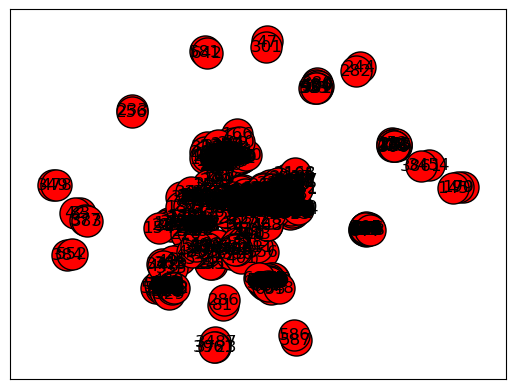

In [40]:
for i in  range(K):
    with open(absolute_path+"k_"+ str(i) +".txt", 'w') as fp:
        for item in comm[i]:
            print(item)
            for j in range(row):
                if edge_mat[item][j]==1 and j in comm[i]:
                    items = str(item)+ ' ' +str(j)
                    fp.write( "%s\n" % items )
                    print(' \t node '+str(item) + ' is connected with :'+str(j))
        print( 'Done adding k_'+ str(i) )
    Graph = nx.read_edgelist(absolute_path+"k_"+ str(i) +".txt",create_using=nx.Graph(),nodetype=int)
    sp = nx.spring_layout(Graph)
    nx.draw_networkx(Graph,pos=sp,node_color='red',with_labels=True,edgecolors='black',node_size=500)
    plt.show()

# Application w_topsis for each cluster 

In [41]:
from math import *
import import_ipynb 
from TOPSIS import Topsis

importing Jupyter notebook from TOPSIS.ipynb


In [42]:

def apply_w_topsis(dx):    
    Graph = nx.read_edgelist(absolute_path+"k_"+ str(dx) +".txt",create_using=nx.Graph(),nodetype=int)
    sp = nx.spring_layout(Graph)
    nx.draw_networkx(Graph,pos=sp,node_color='red',with_labels=True,edgecolors='black',node_size=500)
    row = Graph.number_of_nodes()
    print(row)
    plt.rcParams.update({'figure.figsize': (15, 10)})
    deg_centrality = nx.degree_centrality(Graph)
    bet_centrality = nx.betweenness_centrality(Graph)
    close_centrality = nx.closeness_centrality(Graph)
    #eig_centrality=nx.eigenvector_centrality(Graph)
    Matrix=pd.DataFrame()
    for noued in Graph:
    #add the name of each node with its measures centrality
        Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
                        'CC':close_centrality[noued]}, ignore_index=True)
    Matrix.to_csv(absolute_path+"data/Matrix.csv" ,index=False)
    Matrix_arr= Matrix[['DC','BC','CC']].to_numpy()
    m = row
    ev_matrix_np = Matrix_arr
    sum = np.zeros(4)

    for i in range(m):
        for j in range(3):
            sum[j] += ev_matrix_np[i][j]

    p = np.copy(ev_matrix_np)

    for i in range(m):
        for j in range(3):
            p[i][j] = ev_matrix_np[i][j]/sum[j]
    k = 1/log(m)
    E = []
    for j in range(3):
        temp_sum = 0
        for i in range(m):
            try:
                pij = p[i][j]
                temp_sum += pij*log(pij)
            except:
                pij = 1
                temp_sum += pij*log(pij)
        E.append(-k*temp_sum)
    D = []
    for i in range(3):
        D.append(1-E[i])
    sm = np.sum(D)
    weights = [D[i]/sm for i in range(3)]
    weights
    Evaluation_matrix = Matrix_arr

    criteria = np.array([True,True,True,True])

    T = Topsis(Evaluation_matrix,weights,criteria)
    print(T.calc())
    print("best_distance\t", T.best_distance)
    print("worst_distance\t", T.worst_distance)
    print("worst_similarity\t", T.worst_similarity)
    print("rank_to_worst_similarity\t", T.rank_to_worst_similarity())
    print("best_similarity\t", T.best_similarity)
    print("rank_to_best_similarity\t", T.rank_to_best_similarity())
    #Convert S+ and S- to array numpy
    Best_Dist = np.array(T.best_distance)
    Worst_Dist = np.array(T.worst_distance)
# Calculate Closness
    Closnness = []
    Closnness = Worst_Dist / (Worst_Dist + Best_Dist)
# print(Closnness)
#Convert S+, S- and Closnness to DataFrame 
    Worst_Distance = pd.DataFrame(Worst_Dist,columns=['S-'])
    Best_Distance = pd.DataFrame(Best_Dist,columns=['S+'])
    Clos = pd.DataFrame(Closnness,columns=['C'])
# Concatenate results
    Out = pd.concat([Best_Distance, Worst_Distance, Clos], axis=1)
# print(Out)
#sort DataFrame by Closnness Column (Descending)
    Out = Out.sort_values(by="C",ascending=False)
# Out

# Save it into a csv file (out.csv)
    Out.to_csv(absolute_path+"data/Out_"+ str(dx) +".csv",index=False)
#Call the function Ranking_closness
#Function return the index of the grather value(Closness vector) based on a descending order
    def ranking_closness(data):
        return [i for i in data.argsort()[-len(data):][::-1]]
#Call the function Ranking_closness
    C = ranking_closness(Closnness)
#retrieve the nodes that correspond to the indices returned by the function above
    Tab = []
    for i in range(len(C)):
        Tab.append(Matrix['Node'].loc[C[i]])
#Convert Tab above to DataFrame 
    Tab_Data=pd.DataFrame(Tab,columns=["Node"])

    Tab_Data["Node"].to_csv(absolute_path+"data/cluster_topsis/Topsis_"+ str(dx) +".csv",index=False)
    Final_Tab = pd.concat([pd.read_csv(absolute_path+"data/Out_"+ str(dx) +".csv"),Tab_Data],axis=1)
    print(Final_Tab)

    Out1 = pd.concat([Matrix, Clos], axis=1)
# Out1
    Out1 = Out1.sort_values(by="C",ascending=False)
# Out1

# Save it into a csv file (out.csv)
    Out1.to_csv(absolute_path+"data/Out1_"+ str(dx) +".csv",index=False)
    # Final_Tab1 = pd.concat([pd.read_csv(absolute_path+"data/Out1_"+ str(dx) +".csv")],axis=1)
    res= pd.concat([pd.read_csv(absolute_path+"data/Out1_"+ str(dx) +".csv"),pd.read_csv(absolute_path+"data/Out_"+ str(dx) +".csv")],axis=1)
    res.to_csv(absolute_path+"data/res/res_"+ str(dx) +".csv",index=False)
    
    #The top-10 ranked nodes by degree centrality (DC)
    DCR = res[["Node", "DC"]]
    DCR = DCR.sort_values(by='DC', ascending=False)
    DCR.rename(columns = {'Node':'DCN'}, inplace=True)

    DCR["DCN"].to_csv(absolute_path+"data/SI/DCR"+ str(dx) +".csv",index=False)



#The top-10 ranked nodes by betweenness centrality (BC)
    BCR = res[["Node", "BC"]]
    BCR = BCR.sort_values(by='BC', ascending=False)
    BCR.rename(columns = {'Node':'BCN'}, inplace=True)

    BCR["BCN"].to_csv(absolute_path+"data/SI/BCR"+ str(dx) +".csv",index=False)



#The top-10 ranked nodes by closeness centrality (CC)
    CCR = res[["Node", "CC"]]
    CCR = CCR.sort_values(by='CC', ascending=False)
    CCR.rename(columns = {'Node':'CCN'}, inplace=True)

    CCR["CCN"].to_csv(absolute_path+"data/SI/CCR"+ str(dx) +".csv",index=False)


    fac = pd.concat([pd.read_csv(absolute_path+"data/SI/DCR"+ str(dx) +".csv"),pd.read_csv(absolute_path+"data/SI/BCR"+ str(dx) +".csv"), pd.read_csv(absolute_path+"data/SI/CCR"+ str(dx) +".csv")],axis=1)

    facebook = pd.concat([pd.read_csv(absolute_path+"data/cluster_topsis/Topsis_"+ str(dx) +".csv"),fac],axis=1)
    facebook.to_csv(absolute_path+"data/dataFilter/data"+ str(dx) +".csv",index=False)

cluster  0 :
1085


C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: 

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: 

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: 

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: 

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: 

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: 

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: 

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: 

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: 

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: 

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: 

Step 1
 [[7.38007380e-03 4.10490848e-06 7.01186367e-02]
 [5.53505535e-03 2.34450307e-06 6.98183427e-02]
 [8.30258303e-02 6.02984056e-03 1.12820644e-01]
 ...
 [9.22509225e-04 0.00000000e+00 1.86619844e-01]
 [9.22509225e-04 0.00000000e+00 9.22509225e-04]
 [9.22509225e-04 0.00000000e+00 9.22509225e-04]]

Step 2
 [[4.63345157e-03 4.27633819e-05 1.05142226e-02]
 [3.47508868e-03 2.44241450e-05 1.04691938e-02]
 [5.21263302e-02 6.28165953e-02 1.69173478e-02]
 ...
 [5.79181447e-04 0.00000000e+00 2.79834674e-02]
 [5.79181447e-04 0.00000000e+00 1.38329377e-04]
 [5.79181447e-04 0.00000000e+00 1.38329377e-04]]

Step 3
 [[8.47878232e-04 3.19824555e-05 7.26699578e-04]
 [6.35908674e-04 1.82666594e-05 7.23587374e-04]
 [9.53863011e-03 4.69801236e-02 1.16925711e-03]
 ...
 [1.05984779e-04 0.00000000e+00 1.93410152e-03]
 [1.05984779e-04 0.00000000e+00 9.56075441e-06]
 [1.05984779e-04 0.00000000e+00 9.56075441e-06]]

Step 4
 [1.05984779e-04 0.00000000e+00 9.56075441e-06] [0.01568575 0.3251008  0.00327003]



185


C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: 

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: 

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: 

Step 1
 [[9.23913043e-02 4.30858835e-03 3.07845289e-01]
 [1.63043478e-01 4.18227115e-02 3.66868258e-01]
 [1.14130435e-01 5.26030175e-03 3.07845289e-01]
 [1.46739130e-01 9.22849510e-03 3.18911623e-01]
 [5.43478261e-02 4.11832640e-04 2.56807780e-01]
 [1.08695652e-01 3.11163092e-02 3.27473008e-01]
 [3.26086957e-02 3.05424023e-03 3.04959239e-01]
 [1.14130435e-01 3.94123969e-03 3.07845289e-01]
 [4.34782609e-02 1.34815762e-04 2.52162678e-01]
 [7.60869565e-02 6.50632735e-03 3.26377781e-01]
 [7.06521739e-02 9.51335540e-04 2.83683013e-01]
 [1.25000000e-01 5.53631044e-03 3.29685664e-01]
 [8.69565217e-02 1.17260036e-03 2.94824642e-01]
 [1.14130435e-01 3.53588717e-03 2.97521209e-01]
 [5.97826087e-02 8.84839133e-04 2.85341978e-01]
 [8.15217391e-02 6.45512612e-03 3.03065082e-01]
 [1.46739130e-01 1.25978927e-02 3.48524845e-01]
 [6.52173913e-02 5.21573368e-04 2.81230422e-01]
 [2.11956522e-01 1.78469598e-02 3.71053067e-01]
 [1.73913043e-01 9.50873375e-03 3.54861660e-01]
 [1.03260870e-01 4.11953255e-03 

1077


C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: 

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: 

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: 

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: 

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: 

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: 

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: 

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: 

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: 

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: 

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: 

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: 

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: 

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: 

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: 

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: 

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: 

Step 1
 [[2.78810409e-03 2.44857358e-04 2.40877546e-01]
 [3.71747212e-03 9.62924585e-04 2.80208333e-01]
 [7.43494424e-03 3.72960115e-03 2.30456200e-01]
 ...
 [9.29368030e-04 0.00000000e+00 2.82711508e-01]
 [9.29368030e-04 0.00000000e+00 2.47413198e-01]
 [9.29368030e-04 0.00000000e+00 2.32548087e-01]]

Step 2
 [[0.0013224  0.00142661 0.02126133]
 [0.0017632  0.00561028 0.02473291]
 [0.00352641 0.02172976 0.02034148]
 ...
 [0.0004408  0.         0.02495386]
 [0.0004408  0.         0.02183821]
 [0.0004408  0.         0.02052612]]

Step 3
 [[0.00031917 0.00107388 0.00012535]
 [0.00042556 0.00422313 0.00014582]
 [0.00085112 0.01635702 0.00011993]
 ...
 [0.00010639 0.         0.00014712]
 [0.00010639 0.         0.00012875]
 [0.00010639 0.         0.00012102]]

Step 4
 [1.06390422e-04 0.00000000e+00 9.10023981e-05] [2.69167769e-02 4.50761181e-01 2.49193483e-04]

Step 5
 [1.09529420e-03 4.23552472e-03 1.63739901e-02 ... 5.61173485e-05
 3.77485229e-05 3.00128938e-05] [0.45047322 0.44732318 0.43

cluster  3 :
2
Step 1
 [[1. 0. 1.]
 [1. 0. 1.]]

Step 2
 [[0.70710678        nan 0.70710678]
 [0.70710678        nan 0.70710678]]

Step 3
 [[nan nan nan]
 [nan nan nan]]

Step 4
 [nan nan nan] [nan nan nan]

Step 5
 [nan nan] [nan nan]

Step 6
 [nan nan] [nan nan]

None
best_distance	 [nan nan]
worst_distance	 [nan nan]
worst_similarity	 [nan nan]
rank_to_worst_similarity	 [1, 2]
best_similarity	 [nan nan]
rank_to_best_similarity	 [1, 2]
   S+  S-   C  Node
0 NaN NaN NaN  1684
1 NaN NaN NaN   107
cluster  4 :


C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],


201


C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: 

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: 

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: 

Step 1
 [[7.65000000e-01 1.10097248e-03 8.09716599e-01]
 [9.05000000e-01 1.77083880e-03 9.13242009e-01]
 [7.80000000e-01 1.12349622e-03 8.19672131e-01]
 [5.95000000e-01 4.26662652e-04 7.11743772e-01]
 [9.10000000e-01 1.74517091e-03 9.17431193e-01]
 [5.15000000e-01 2.99924480e-04 6.73400673e-01]
 [9.00000000e-01 1.56219269e-03 9.09090909e-01]
 [9.20000000e-01 1.93919945e-03 9.25925926e-01]
 [6.00000000e-01 4.25092866e-04 7.14285714e-01]
 [8.95000000e-01 1.49494521e-03 9.04977376e-01]
 [8.45000000e-01 1.45714392e-03 8.65800866e-01]
 [8.40000000e-01 1.58491216e-03 8.62068966e-01]
 [8.95000000e-01 1.50336669e-03 9.04977376e-01]
 [8.50000000e-01 1.36018228e-03 8.69565217e-01]
 [9.40000000e-01 2.12469814e-03 9.43396226e-01]
 [4.15000000e-01 1.82435336e-04 6.30914826e-01]
 [9.70000000e-01 2.48303172e-03 9.70873786e-01]
 [6.60000000e-01 6.11037544e-04 7.46268657e-01]
 [7.55000000e-01 1.01430298e-03 8.03212851e-01]
 [7.75000000e-01 9.61014892e-04 8.16326531e-01]
 [9.10000000e-01 1.71813367e-03 

554


C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: 

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: 

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: 

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: 

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: 

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: 

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: 

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: 

Step 1
 [[5.42495479e-03 3.27593888e-06 5.42495479e-03]
 [3.61663653e-03 0.00000000e+00 4.06871609e-03]
 [5.42495479e-03 3.27593888e-06 5.42495479e-03]
 ...
 [1.80831826e-03 0.00000000e+00 1.93147672e-01]
 [1.80831826e-03 0.00000000e+00 1.72134715e-01]
 [1.80831826e-03 0.00000000e+00 1.93147672e-01]]

Step 2
 [[6.83511405e-03 1.49439690e-05 1.07680876e-03]
 [4.55674270e-03 0.00000000e+00 8.07606574e-04]
 [6.83511405e-03 1.49439690e-05 1.07680876e-03]
 ...
 [2.27837135e-03 0.00000000e+00 3.83382193e-02]
 [2.27837135e-03 0.00000000e+00 3.41673206e-02]
 [2.27837135e-03 0.00000000e+00 3.83382193e-02]]

Step 3
 [[1.11558352e-03 1.14569708e-05 7.55107506e-05]
 [7.43722350e-04 0.00000000e+00 5.66330630e-05]
 [1.11558352e-03 1.14569708e-05 7.55107506e-05]
 ...
 [3.71861175e-04 0.00000000e+00 2.68845111e-03]
 [3.71861175e-04 0.00000000e+00 2.39596864e-03]
 [3.71861175e-04 0.00000000e+00 2.68845111e-03]]

Step 4
 [3.71861175e-04 0.00000000e+00 2.51702502e-05] [0.0249147  0.42862933 0.00442635]



824


C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: 

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: 

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: 

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: 

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: 

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: 

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: 

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_17688\1306851478.py:15: 

Step 1
 [[0.01579587 0.00066355 0.09862567]
 [0.02308627 0.00178415 0.10451052]
 [0.0328068  0.00191904 0.10019281]
 ...
 [0.00121507 0.         0.11141833]
 [0.00243013 0.         0.09180513]
 [0.00243013 0.         0.09180513]]

Step 2
 [[0.02228728 0.00697203 0.03200529]
 [0.03257372 0.01874636 0.033915  ]
 [0.04628896 0.02016365 0.03251385]
 ...
 [0.00171441 0.         0.03615668]
 [0.00342881 0.         0.02979194]
 [0.00342881 0.         0.02979194]]

Step 3
 [[0.00363473 0.00530988 0.00241056]
 [0.0053123  0.01427717 0.00255439]
 [0.00754906 0.01535658 0.00244886]
 ...
 [0.00027959 0.         0.00272323]
 [0.00055919 0.         0.00224385]
 [0.00055919 0.         0.00224385]]

Step 4
 [2.79594850e-04 0.00000000e+00 2.96980204e-05] [0.02124921 0.31950565 0.00478396]

Step 5
 [6.71716036e-03 1.53473083e-02 1.71616438e-02 3.03687281e-03
 4.23604154e-03 1.48170639e-02 5.80806205e-03 2.36706746e-03
 9.67450638e-03 5.27371831e-03 1.09231719e-02 2.50993890e-02
 5.60765840e-03 1.2716550

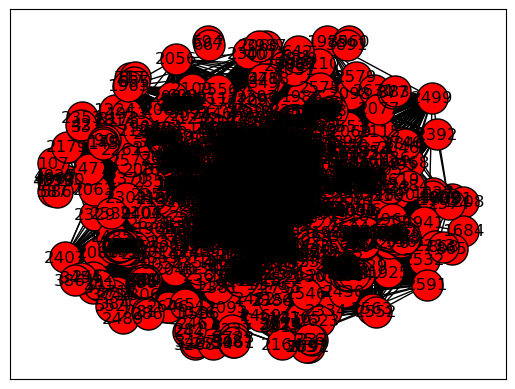

In [43]:
# Applying topsis on each cluster.
import os 
for i in range(K):
    file_size = os.stat(absolute_path+'k_'+str(i)+'.txt').st_size
    if file_size == 0:
        print('cluster ',i,':')
        FF = pd.DataFrame(Final_Tab.loc[i])
        print(FF.T)
    else:
        print('cluster ',i,':')
        apply_w_topsis(i)

In [44]:
for i in range(K):
    res =absolute_path+"data/res/res_"+ str(i)+'.csv'
    path = res
    if(os.path.isfile(path) == False):
        print('cluster',i,':')
        FF = pd.DataFrame(Final_Tab.loc[i])
        res = FF.T
        print(res)
    else:
        print('clusterS',i,':')
        res = pd.read_csv(absolute_path+"data/res/res_"+ str(i) +".csv")
        res =res.head(1)
        print(res)
    res.to_csv(absolute_path+'data/res1/res_'+str(i)+'.csv', index=False, encoding='utf-8-sig')
        

clusterS 0 :
   Node        DC        BC        CC         C       S+        S-       C.1
0  2754  0.111624  0.041726  0.284315  0.991227  0.00288  0.325363  0.991227
clusterS 1 :
   Node        DC        BC        CC    C   S+        S-  C.1
0   705  0.288043  0.063698  0.391915  1.0  0.0  0.309258  1.0
clusterS 2 :
   Node        DC        BC        CC        C        S+        S-      C.1
0  1086  0.189591  0.102779  0.478861  0.98858  0.005213  0.451278  0.98858
clusterS 3 :
   Node   DC   BC   CC   C  S+  S-  C.1
0   107  1.0  0.0  1.0 NaN NaN NaN  NaN
clusterS 4 :
   Node     DC       BC        CC    C   S+        S-  C.1
0  2266  0.985  0.00253  0.985222  1.0  0.0  0.106498  1.0
clusterS 5 :
   Node        DC       BC        CC         C        S+        S-       C.1
0  3604  0.108499  0.12256  0.318004  0.993972  0.002603  0.429213  0.993972
clusterS 6 :
   Node        DC        BC        CC    C   S+        S-  C.1
0  2313  0.092345  0.039927  0.195731  1.0  0.0  0.320228  1.0

In [45]:
#then let's take the first node in each cluster and concatenat theme in one file 
# named final_res
import glob
ss = absolute_path+'data/res1/'
extension = 'csv'
all_filenames = [i for i in glob.glob(ss+'*.csv')]
#combine all files in the list
combined_csv = pd.concat([pd.read_csv(f) for f in all_filenames ])

#export to csv
combined_csv.to_csv(absolute_path+"data/res/final_res.csv", index=True, encoding='utf-8-sig')
print(combined_csv)


   Node        DC        BC        CC         C        S+        S-       C.1
0  2754  0.111624  0.041726  0.284315  0.991227  0.002880  0.325363  0.991227
0   705  0.288043  0.063698  0.391915  1.000000  0.000000  0.309258  1.000000
0  1086  0.189591  0.102779  0.478861  0.988580  0.005213  0.451278  0.988580
0   107  1.000000  0.000000  1.000000       NaN       NaN       NaN       NaN
0  2266  0.985000  0.002530  0.985222  1.000000  0.000000  0.106498  1.000000
0  3604  0.108499  0.122560  0.318004  0.993972  0.002603  0.429213  0.993972
0  2313  0.092345  0.039927  0.195731  1.000000  0.000000  0.320228  1.000000
0  1559  0.084967  0.022014  0.093728  0.973983  0.007776  0.291093  0.973983
0   136  0.040123  0.035596  0.118627  0.926015  0.024846  0.310975  0.926015
0  1684  0.266055  0.065535  0.266189  0.967974  0.010400  0.314350  0.967974


In [46]:
for dx in range(10):
        DCR = combined_csv[["Node", "DC"]]
        DCR = DCR.sort_values(by='DC', ascending=False)
        DCR.rename(columns = {'Node':'DCN'}, inplace=True)

        DCR["DCN"].to_csv(absolute_path+"data/nodeK/DCR"+ str(dx) +".csv",index=False)
        
        Node = combined_csv[["Node"]]
        Node['Node'].to_csv(absolute_path+"data/nodeK/Node"+ str(dx) +".csv",index=False)
#The top-10 ranked nodes by betweenness centrality (BC)
        BCR = combined_csv[["Node", "BC"]]
        BCR = BCR.sort_values(by='BC', ascending=False)
        BCR.rename(columns = {'Node':'BCN'}, inplace=True)

        BCR["BCN"].to_csv(absolute_path+"data/nodeK/BCR"+ str(dx) +".csv",index=False)



#The top-10 ranked nodes by closeness centrality (CC)
        CCR = combined_csv[["Node", "CC"]]
        CCR = CCR.sort_values(by='CC', ascending=False)
        CCR.rename(columns = {'Node':'CCN'}, inplace=True)

        CCR["CCN"].to_csv(absolute_path+"data/nodeK/CCR"+ str(dx) +".csv",index=False)





        facebookK = pd.concat([pd.read_csv(absolute_path+"data/nodeK/Node"+ str(dx) +".csv"),pd.read_csv(absolute_path+"data/nodeK/DCR"+ str(dx) +".csv"),pd.read_csv(absolute_path+"data/nodeK/BCR"+ str(dx) +".csv"), pd.read_csv(absolute_path+"data/nodeK/CCR"+ str(dx) +".csv")],axis=1)

facebookK.to_csv(absolute_path+"data/dataFilterK/data.csv",index=False)
    

In [47]:
facebookK

,Node,DCN,BCN,CCN
0,2754,107,3604,107
1,705,2266,1086,2266
2,1086,705,1684,1086
3,107,1684,705,705
4,2266,1086,2754,3604
5,3604,2754,2313,2754
6,2313,3604,136,1684
7,1559,2313,1559,2313
8,136,1559,2266,136
9,1684,136,107,1559


# Application SI

In [48]:
import ndlib.models.ModelConfig as mc
import ndlib.models.epidemics as ep

In [49]:
w_facebook = pd.read_csv("Data/w_topsisData.csv")
w_facebook

,w_DCN,w_BCN,w_CCN,w_ECN,w_Node
0,107,107,107,1912,107
1,1684,1684,58,2266,1684
2,1912,3437,428,2206,3437
3,3437,1912,563,2233,1912
4,0,1085,1684,2464,1085
5,2543,0,171,2142,0
6,2347,698,348,2218,698
7,1888,567,483,2078,567
8,1800,58,414,2123,58
9,1663,428,376,1993,428


In [50]:
def SI(node):
    n = row
    model = ep.SIModel(G)
    cfg = mc.Configuration()
    cfg.add_model_parameter('beta', 1)
    cfg.add_model_initial_configuration('Infected', node)
    model.set_initial_status(cfg)
    res = pd.DataFrame(columns=['iteration', 'nb_Susceptible', 'Nb_infected'])
    for i in range(n):
        iteration = model.iteration()
        res.loc[len(res.index)] = [iteration['iteration'],iteration['node_count'][0], iteration['node_count'][1] ]
        if iteration['node_count'][1] == n:
            break 
    return res

In [51]:
Rank_DC = SI(set(facebookK['DCN']))
Rank_BC = SI(set(facebookK['BCN']))
#Rank_EC = SI(set(facebookK['ECN']))
Rank_CC = SI(set(facebookK['CCN']))
Rank_kmeans = SI(set(facebookK['Node']))

In [52]:
w_Rank_DC = SI(set(w_facebook['w_DCN']))
w_Rank_BC = SI(set(w_facebook['w_BCN']))
w_Rank_CC = SI (set(w_facebook['w_CCN']))
w_Rank_EC = SI(set(w_facebook['w_ECN']))
w_Rank_Topsis = SI(set(w_facebook['w_Node']))

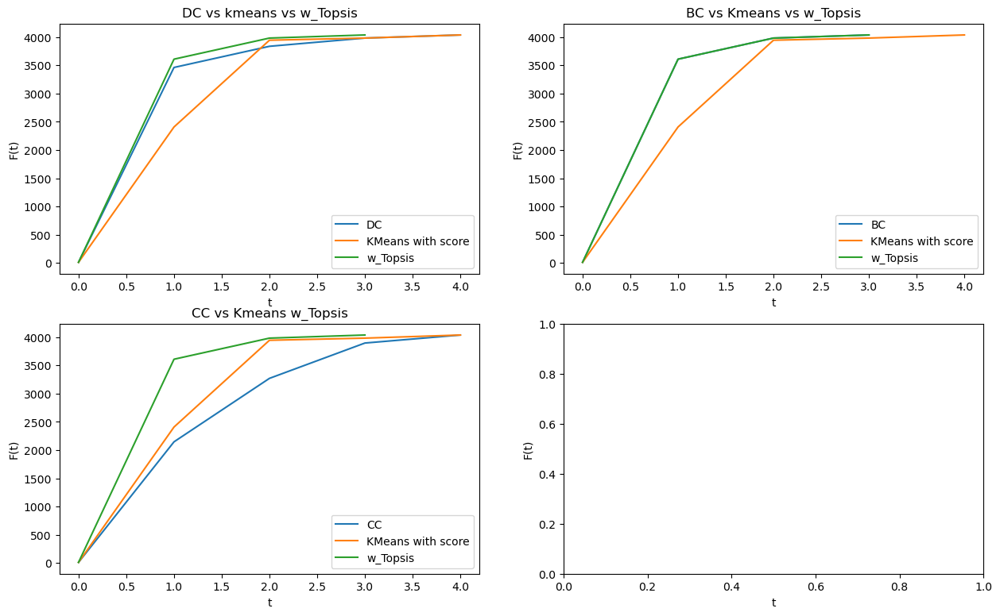

In [53]:
fig, axs = plt.subplots(2, 2, figsize=(15, 9))
axs[0, 0].plot(w_Rank_DC['iteration'], w_Rank_DC['Nb_infected'], label="DC")
axs[0, 0].plot(Rank_kmeans['iteration'],Rank_kmeans['Nb_infected'], label="KMeans with score")
axs[0, 0].plot(w_Rank_Topsis['iteration'], w_Rank_Topsis['Nb_infected'], label="w_Topsis")
axs[0, 0].set_title("DC vs kmeans vs w_Topsis")
axs[0, 0].legend()

axs[0, 1].plot(w_Rank_BC['iteration'], w_Rank_BC['Nb_infected'], label="BC")
axs[0, 1].plot(Rank_kmeans['iteration'], Rank_kmeans['Nb_infected'], label="KMeans with score")
axs[0, 1].plot(w_Rank_Topsis['iteration'], w_Rank_Topsis['Nb_infected'], label="w_Topsis")
axs[0, 1].set_title("BC vs Kmeans vs w_Topsis")
axs[0, 1].legend()

axs[1, 0].plot(w_Rank_CC['iteration'], w_Rank_CC['Nb_infected'], label="CC")
axs[1, 0].plot(Rank_kmeans['iteration'], Rank_kmeans['Nb_infected'], label="KMeans with score")
axs[1, 0].plot(w_Rank_Topsis['iteration'], w_Rank_Topsis['Nb_infected'], label="w_Topsis")
axs[1, 0].set_title("CC vs Kmeans w_Topsis")
axs[1, 0].legend()



for ax in axs.flat:
    ax.set(xlabel='t', ylabel='F(t)')